# Capstone Project : Sentiment Based Product Recommendation System**


## Project Statement
### Ebuss is a e-commerce company which has captured huge market in different fields like household essentials, books, personal care products, medicines, cosmetic items, beauty products, electrical appliances, kitchen and dining products and health care products.
### We need to build a model that will improve the recommendations given to the users given their past reviews and ratings.
## Result Expected
    - Feature extraction
    - Training a text classification model
    - Building a recommendation system in User-based and Item-based recommendation system
    - Deployment the project with a user interface

### Few Data Dictionary reference
    - id:	Uniques identity number to identify each unique review given by the user to a particular product in                             the dataset
    - brand: Name of the brand of the product to which user has given review and rating
    - categories:	Category of the product like household essentials, books, personal care products, medicines,                                   cosmetic items, beauty products, electrical appliances, kitchen and dining products, health care                               products and many more.
    - manufacturer:	Name of the manufacturer of the product
    - name:	Name of the product to which user has added review or rating
    - reviews_date:	Date on which the review has been added by the user
    - reviews_didPurchase:	Whether a particular user has purchased the product or not
    - reviews_doRecommend:	Whether a particular user has recommended the product or not
    - reviews_rating:	Rating given by the user to a particular product
    - reviews_text:	Review given by the user to a particular product
    - reviews_title:	The title of the review given by the user to a particular product
    - reviews_userCity:	The residing city of the user
    - reviews_userProvince: The residing province of the user
    - reviews_username:	The unique identification for individual user in the dataset
    - user_sentiment:	The overall sentiment of the user for a particular product (Positive or Negative)

- We might need the surprise model to build. I have done conda install -c conda-forge scikit-surprise
- For safer side, i have placed pip install for scikit-surprise, surprise to install in the machine, if the import is not available.
- Expectations: All the base setup is present in the machine which is to be used

In [1]:
!pip install scikit-surprise

In [2]:
!pip install surprise

## Data Understanding

In [3]:
# To remove Warnings, adding the below libraries

import warnings
warnings.filterwarnings('ignore')

In [4]:
### Importing Pandas librries
import numpy as np
import pandas as pd

### Importing the libraries for visualisation
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/hariram/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/hariram/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /Users/hariram/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/hariram/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to /Users/hariram/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [6]:
import random
from numpy import *
from datetime import datetime
import re

In [7]:
from wordcloud import WordCloud

In [8]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import SnowballStemmer
from nltk import FreqDist
from nltk.tokenize import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet

In [9]:
import pickle
from sklearn.feature_extraction.text import TfidfTransformer

In [10]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

In [11]:
from sklearn.model_selection import train_test_split

In [12]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection  import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV

In [13]:
from imblearn.over_sampling import SMOTE
from collections import Counter

In [14]:
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier


In [15]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from sklearn.metrics import precision_score,f1_score

In [16]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from sklearn.metrics import precision_score,f1_score
from sklearn.metrics import matthews_corrcoef

In [17]:
from sklearn.metrics import f1_score, classification_report,precision_score,recall_score,confusion_matrix, roc_auc_score, roc_curve

from sklearn.metrics.pairwise import pairwise_distances

In [18]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.options.mode.chained_assignment = None  # default='warn'

In [19]:
lemmatizer = nltk.stem.WordNetLemmatizer()
wordnet_lemmatizer = WordNetLemmatizer()

In [20]:
stop_words = set(stopwords.words('english'))

##### Loading the data file into df dataframe

In [21]:
df = pd.read_csv('sample30.csv')
df.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the...,Just Awesome,Los Angeles,NaN,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part...,Good,NaN,NaN,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,NaN,NaN,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,I read through the reviews on here before look...,Disappointed,NaN,NaN,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel cau...,Irritation,NaN,NaN,walker557,Negative


In [22]:
df.shape

(30000, 15)

- There are total of 30K records and 15 columns. Lets Analyse the data

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   id                    30000 non-null  object
 1   brand                 30000 non-null  object
 2   categories            30000 non-null  object
 3   manufacturer          29859 non-null  object
 4   name                  30000 non-null  object
 5   reviews_date          29954 non-null  object
 6   reviews_didPurchase   15932 non-null  object
 7   reviews_doRecommend   27430 non-null  object
 8   reviews_rating        30000 non-null  int64 
 9   reviews_text          30000 non-null  object
 10  reviews_title         29810 non-null  object
 11  reviews_userCity      1929 non-null   object
 12  reviews_userProvince  170 non-null    object
 13  reviews_username      29937 non-null  object
 14  user_sentiment        29999 non-null  object
dtypes: int64(1), object(14)
memory usage

- We see null columns in the data, Lets analyse each column one by one.

In [24]:
df.isnull().sum()

id                          0
brand                       0
categories                  0
manufacturer              141
name                        0
reviews_date               46
reviews_didPurchase     14068
reviews_doRecommend      2570
reviews_rating              0
reviews_text                0
reviews_title             190
reviews_userCity        28071
reviews_userProvince    29830
reviews_username           63
user_sentiment              1
dtype: int64

# Exploratory data analysis and Data cleaning

In [25]:
(df['reviews_userProvince'].isnull().sum()/df['reviews_rating'].count())*100

99.43333333333332

In [26]:
(df['reviews_userCity'].isnull().sum()/df['reviews_rating'].count())*100


93.57

- We can see more than 90% null values in 'reviews_userProvince' and 'reviews_userCity' columns. These columns doesnt have useful information for the analysis. So deleting both the columns.

In [27]:
df.drop(['reviews_userCity','reviews_userProvince'],axis=1,inplace=True)


In [28]:
df.shape

(30000, 13)

In [29]:
df.isnull().sum()

id                         0
brand                      0
categories                 0
manufacturer             141
name                       0
reviews_date              46
reviews_didPurchase    14068
reviews_doRecommend     2570
reviews_rating             0
reviews_text               0
reviews_title            190
reviews_username          63
user_sentiment             1
dtype: int64

In [30]:
# Lets check the number of users we have
df['reviews_username'].unique().size

24915

In [31]:
# The unique products provided for analysis
df['name'].unique().size

271

In [32]:
df = df[~(df.reviews_username.isnull())]
df.shape

(29937, 13)

- Without username, we cannot perform our analysis. If we label it as something, then the recommendation would not be proper. so we will remove the rows which doesnt have username

In [33]:
df[df['reviews_rating'].isin([3,4,5]) & (df['user_sentiment'].isin(['Negative']))].shape

(2624, 13)

In [34]:
df[df['reviews_rating'].isin([1,2]) & (df['user_sentiment'].isin(['Positive']))].shape

(1058, 13)

- We see that the reviews_rating and the user sentiment is not matching. We will bring it match with each other. When read the data manually understood that the review rating and review text are matching, hence, we will change the user sentiment accordingly

In [35]:
df['user_sentiment'].isnull().sum()

1

In [36]:
df[df['user_sentiment'].isnull()]

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment
28354,AVpfRTh1ilAPnD_xYic2,Disney,"Movies, Music & Books,Movies,Kids' & Family,Wa...",Walt Disney,Planes: Fire Rescue (2 Discs) (includes Digita...,2014-11-07T00:00:00.000Z,NaN,True,5,my kids absolutely loved this film so much tha...,a super hit with my children. they loved it!!??,7.87E+11,NaN


- One user sentiment is null, As per our previous decision we will change the user sentiment as per the review rating.

In [37]:
df.loc[df['reviews_rating'].isin([3,4,5]), ('user_sentiment')] = 'Positive'
df.loc[df['reviews_rating'].isin([1,2]), ('user_sentiment')] = 'Negative'

In [38]:
df[df['reviews_rating'].isin([3,4,5]) & (df['user_sentiment'].isin(['Negative']))].shape

(0, 13)

In [39]:
df['user_sentiment'].isnull().sum()

0

- User Sentiment null is cleared. Now Lets check other columns

In [40]:
df.isnull().sum()

id                         0
brand                      0
categories                 0
manufacturer             141
name                       0
reviews_date              40
reviews_didPurchase    14006
reviews_doRecommend     2541
reviews_rating             0
reviews_text               0
reviews_title            189
reviews_username           0
user_sentiment             0
dtype: int64

- More null values are in the 'reviews_didPurchase' column. Lets analyse it.

In [41]:
(df['reviews_didPurchase'].isnull().sum()/df['reviews_didPurchase'].count())*100

87.9166405122089

- About 87% of records are null. Lets see other data

In [42]:
df['reviews_didPurchase'].value_counts()

False    14497
True      1434
Name: reviews_didPurchase, dtype: int64

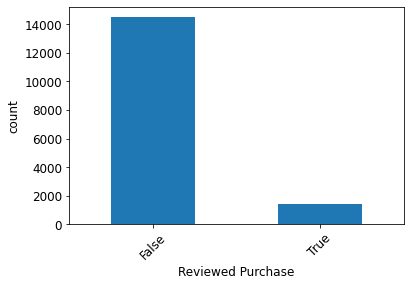

In [43]:
df.reviews_didPurchase.value_counts().plot.bar()
plt.xticks(size=12,rotation = 45)
plt.xlabel('Reviewed Purchase',size=12)
plt.yticks(size=12)
plt.ylabel('count', size=12)
plt.show()

In [44]:
df[(df['reviews_didPurchase']==False)]['reviews_rating'].value_counts().sort_index(ascending=True)

1      776
2      154
3      373
4     2254
5    10940
Name: reviews_rating, dtype: int64

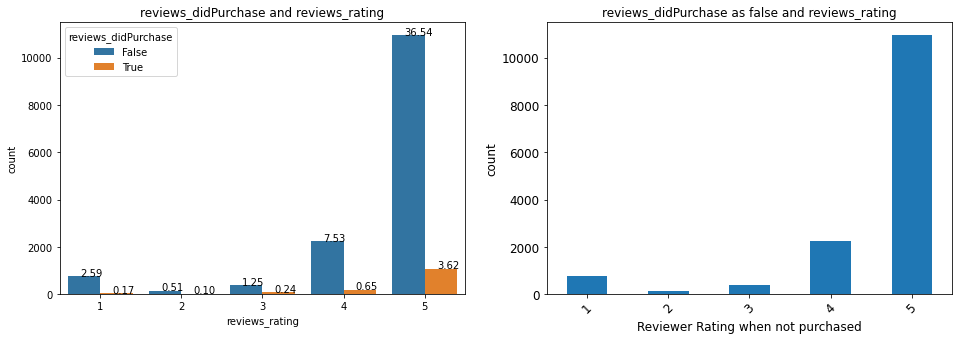

In [45]:
plt.figure(figsize=(16,5))
plt.subplot(1, 2, 1)
graph = sns.countplot(data=df,x='reviews_rating',hue='reviews_didPurchase')
plt.title('reviews_didPurchase and reviews_rating')
for p in graph.patches:
        graph.annotate('{:.2f}'.format(100 * p.get_height()/len(df)), (p.get_x()+ p.get_width() / 2 - 0.05, p.get_y() + p.get_height()),
                    color= 'black')

plt.subplot(1, 2, 2)
df[(df['reviews_didPurchase']==False)]['reviews_rating'].value_counts().sort_index(ascending=True).plot.bar()
plt.xticks(size=12,rotation = 45)
plt.xlabel('Reviewer Rating when not purchased',size=12)
plt.yticks(size=12)
plt.ylabel('count', size=12)
plt.title('reviews_didPurchase as false and reviews_rating')
plt.show()

In [46]:
df[(df['reviews_didPurchase']==False)]['user_sentiment'].value_counts()

Positive    13567
Negative      930
Name: user_sentiment, dtype: int64

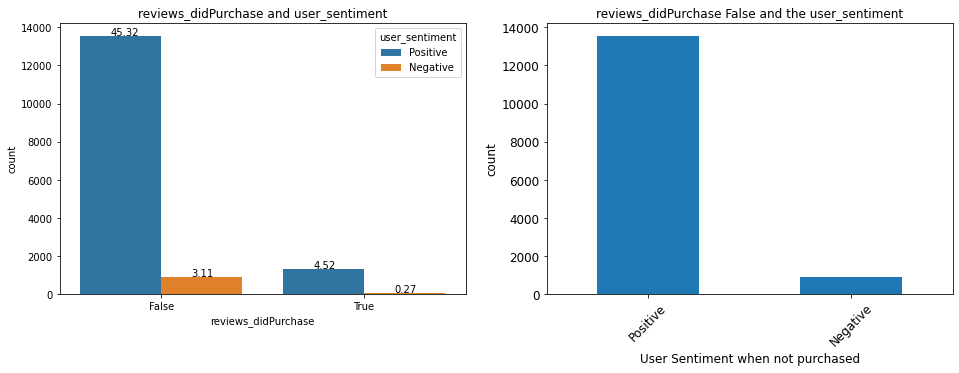

In [47]:
plt.figure(figsize=(16,5))
plt.subplot(1, 2, 1)
graph = sns.countplot(data=df,x='reviews_didPurchase',hue='user_sentiment')
plt.title('reviews_didPurchase and user_sentiment')
for p in graph.patches:
        graph.annotate('{:.2f}'.format(100 * p.get_height()/len(df)), (p.get_x()+ p.get_width() / 2 - 0.05, p.get_y() + p.get_height()),
                    color= 'black')

plt.subplot(1, 2, 2)
df[(df['reviews_didPurchase']==False)]['user_sentiment'].value_counts().plot.bar()
plt.xticks(size=12,rotation = 45)
plt.xlabel('User Sentiment when not purchased',size=12)
plt.yticks(size=12)
plt.ylabel('count', size=12)
plt.title('reviews_didPurchase False and the user_sentiment')
plt.show()

In [48]:
df[(df['reviews_didPurchase']==False)]['reviews_doRecommend'].value_counts()

True     13040
False     1017
Name: reviews_doRecommend, dtype: int64

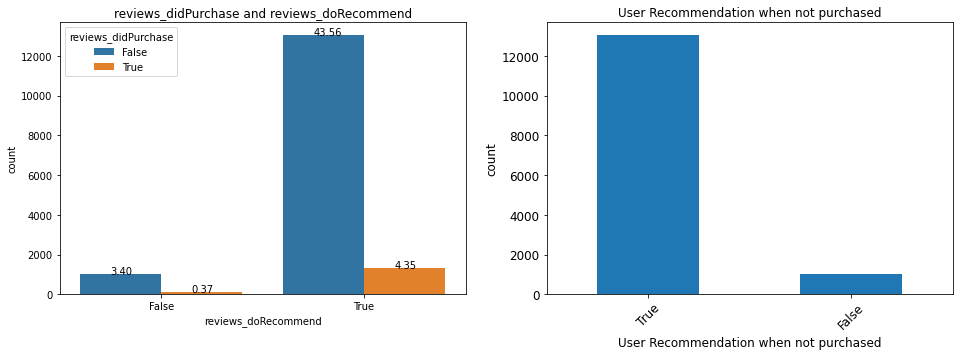

In [49]:
plt.figure(figsize=(16,5))
plt.subplot(1, 2, 1)
graph = sns.countplot(data=df,x='reviews_doRecommend',hue='reviews_didPurchase')
plt.title('reviews_didPurchase and reviews_doRecommend')
for p in graph.patches:
        graph.annotate('{:.2f}'.format(100 * p.get_height()/len(df)), (p.get_x()+ p.get_width() / 2 - 0.05, p.get_y() + p.get_height()),
                    color= 'black')

plt.subplot(1, 2, 2)
df[(df['reviews_didPurchase']==False)]['reviews_doRecommend'].value_counts().plot.bar()
plt.xticks(size=12,rotation = 45)
plt.xlabel('User Recommendation when not purchased',size=12)
plt.yticks(size=12)
plt.ylabel('count', size=12)
plt.title('User Recommendation when not purchased')
plt.show()

Based on the above understanding, the user purchase is not related to any of the other details like Product recommendation, Sentiment and rating. Hence removing the 'reviews_didPurchase' column

In [50]:
df.drop(['reviews_didPurchase'],axis=1,inplace=True)

In [51]:
df.isnull().sum()

id                        0
brand                     0
categories                0
manufacturer            141
name                      0
reviews_date             40
reviews_doRecommend    2541
reviews_rating            0
reviews_text              0
reviews_title           189
reviews_username          0
user_sentiment            0
dtype: int64

In [52]:
(df['reviews_doRecommend'].isnull().sum()/df['reviews_doRecommend'].count())*100

9.275076653526062

In [53]:
df['reviews_doRecommend'].value_counts()

True     25846
False     1550
Name: reviews_doRecommend, dtype: int64

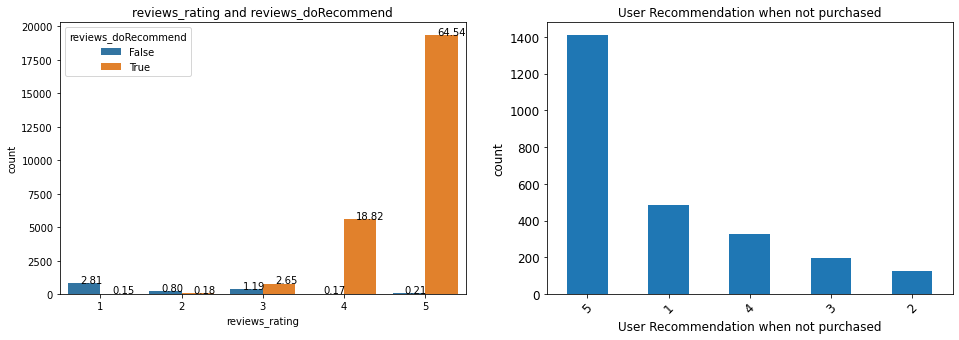

In [54]:
plt.figure(figsize=(16,5))
plt.subplot(1, 2, 1)
graph = sns.countplot(data=df,x='reviews_rating',hue='reviews_doRecommend')
plt.title('reviews_rating and reviews_doRecommend')
for p in graph.patches:
        graph.annotate('{:.2f}'.format(100 * p.get_height()/len(df)), (p.get_x()+ p.get_width() / 2 - 0.05, p.get_y() + p.get_height()),
                    color= 'black')

plt.subplot(1, 2, 2)
df[(df['reviews_doRecommend'].isnull())]['reviews_rating'].value_counts().plot.bar()
plt.xticks(size=12,rotation = 45)
plt.xlabel('User Recommendation when not purchased',size=12)
plt.yticks(size=12)
plt.ylabel('count', size=12)
plt.title('User Recommendation when not purchased')
plt.show()

- There are only 9% data missing in the reviews_doRecommend column. We will assume that if the people are happy about the product, they will recommend the product.

In [55]:
df['reviews_doRecommend']=df['reviews_rating'].apply(lambda x: True if x>=3 else False)

In [56]:
df.isnull().sum()

id                       0
brand                    0
categories               0
manufacturer           141
name                     0
reviews_date            40
reviews_doRecommend      0
reviews_rating           0
reviews_text             0
reviews_title          189
reviews_username         0
user_sentiment           0
dtype: int64

Only Manufacturer, review date and review title have null values. 

- We have the brand and the name of the product. so we can find the product with this. We will replace the null value is 'unknown' word

In [57]:
df['manufacturer']=df['manufacturer'].replace(np.NaN,'Unknown')

- Lets check the review date/

In [58]:
df['reviews_date'].head()

0    2012-11-30T06:21:45.000Z
1    2017-07-09T00:00:00.000Z
2    2017-07-09T00:00:00.000Z
3    2016-01-06T00:00:00.000Z
4    2016-12-21T00:00:00.000Z
Name: reviews_date, dtype: object

- The field 'reviews date' is not in the datetime format. so lets first convert it to date format

In [59]:
df['reviews_date'] = pd.to_datetime(df['reviews_date'],errors='coerce').dt.tz_localize(None)

In [60]:
df['reviews_date'].value_counts().idxmax()

Timestamp('2012-01-26 00:00:00')

- To replace the null value, lets add max used date

In [61]:
df['reviews_date']=df['reviews_date'].replace(np.NaN,df['reviews_date'].value_counts().idxmax())

In [62]:
df['review_yr']=[dt.year for dt in (df['reviews_date'])]

<AxesSubplot:xlabel='review_yr', ylabel='Density'>

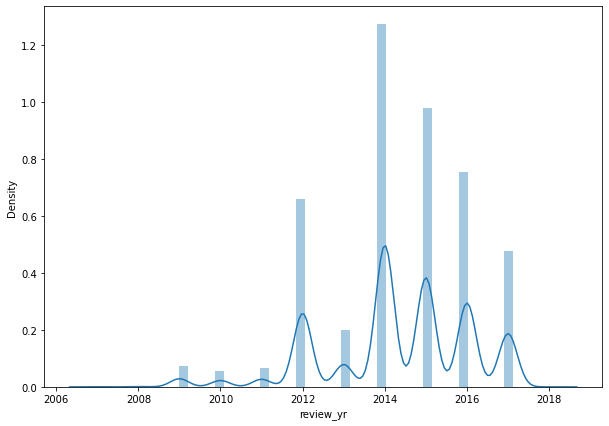

In [63]:

plt.figure(figsize=(10, 7))

sns.distplot(df['review_yr'])

In [64]:
df[df.duplicated(subset={"id","reviews_username","brand","categories","name"}, keep='first')].shape

(2349, 13)

- There are 2349 rows of duplicate records for the same user and for the same product. Hence removing the data

In [65]:
df = df.drop_duplicates(subset={"reviews_username","brand","categories","name"},keep="first")

In [66]:
df.shape

(27588, 13)

In [67]:
df.isnull().sum()

id                       0
brand                    0
categories               0
manufacturer             0
name                     0
reviews_date             0
reviews_doRecommend      0
reviews_rating           0
reviews_text             0
reviews_title          185
reviews_username         0
user_sentiment           0
review_yr                0
dtype: int64

- Only reviews_title is null. Lets check the column value

In [68]:
df[df.reviews_title.isnull()].head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,review_yr
1239,AV1YneDPglJLPUi8IJyQ,Finish,"Household Essentials,Cleaning Supplies,Dish De...",Reckitt Benckiser,"Finish Quantum Dishwasher Detergent, Lemon Spa...",2017-11-16 08:12:30,True,5,Great quality and a great price,NaN,queen 79,Positive,2017
1441,AVpe_dxlilAPnD_xSiHI,The Seaweed Bath Co.,"Personal Care,Hair Care,Conditioner,Beauty,Sha...",The Seaweed Bath,"The Seaweed Bath Co. Argan Conditioner, Smooth...",2013-11-07 00:00:00,True,3,Wanted to love this but it's a bit too heavy f...,NaN,julie,Positive,2013
1442,AVpe_dxlilAPnD_xSiHI,The Seaweed Bath Co.,"Personal Care,Hair Care,Conditioner,Beauty,Sha...",The Seaweed Bath,"The Seaweed Bath Co. Argan Conditioner, Smooth...",2015-02-09 00:00:00,True,3,I have thick coarse hair and for me this just ...,NaN,lisa,Positive,2015
1444,AVpe_dxlilAPnD_xSiHI,The Seaweed Bath Co.,"Personal Care,Hair Care,Conditioner,Beauty,Sha...",The Seaweed Bath,"The Seaweed Bath Co. Argan Conditioner, Smooth...",2017-11-27 18:18:38,True,4,I actually really enjoy this conditioner. Have...,NaN,aland,Positive,2017
1447,AVpe_dxlilAPnD_xSiHI,The Seaweed Bath Co.,"Personal Care,Hair Care,Conditioner,Beauty,Sha...",The Seaweed Bath,"The Seaweed Bath Co. Argan Conditioner, Smooth...",2013-04-15 00:00:00,True,5,This is a great product. I really like the sce...,NaN,darragh,Positive,2013


- Its just the title of the product is missing, lets replace it with brand name

In [69]:
df['reviews_title'] = np.where(~df['reviews_title'].isnull(),df['reviews_title'],df['brand'])

In [70]:
df[df['reviews_title'].isnull()]

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,review_yr


- Now no null values in the reviews_title. Lets take a random location in null value for review_title and check it

In [71]:
df.loc[[1239,]]

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,review_yr
1239,AV1YneDPglJLPUi8IJyQ,Finish,"Household Essentials,Cleaning Supplies,Dish De...",Reckitt Benckiser,"Finish Quantum Dishwasher Detergent, Lemon Spa...",2017-11-16 08:12:30,True,5,Great quality and a great price,Finish,queen 79,Positive,2017


- We see that the review_title is replaced with the brand name

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27588 entries, 0 to 29999
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   id                   27588 non-null  object        
 1   brand                27588 non-null  object        
 2   categories           27588 non-null  object        
 3   manufacturer         27588 non-null  object        
 4   name                 27588 non-null  object        
 5   reviews_date         27588 non-null  datetime64[ns]
 6   reviews_doRecommend  27588 non-null  bool          
 7   reviews_rating       27588 non-null  int64         
 8   reviews_text         27588 non-null  object        
 9   reviews_title        27588 non-null  object        
 10  reviews_username     27588 non-null  object        
 11  user_sentiment       27588 non-null  object        
 12  review_yr            27588 non-null  int64         
dtypes: bool(1), datetime64[ns](1), 

In [73]:
df.isnull().sum()

id                     0
brand                  0
categories             0
manufacturer           0
name                   0
reviews_date           0
reviews_doRecommend    0
reviews_rating         0
reviews_text           0
reviews_title          0
reviews_username       0
user_sentiment         0
review_yr              0
dtype: int64

- All the null value is removed.

- We will change the user sentiment to 0 and 1, o for Negative and 1 for positive

In [74]:
df['user_sentiment']= df['user_sentiment'].apply(lambda x:1 if x=='Positive' else 0)
df.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,review_yr
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30 06:21:45,True,5,i love this album. it's very good. more to the...,Just Awesome,joshua,1,2012
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09 00:00:00,True,5,Good flavor. This review was collected as part...,Good,dorothy w,1,2017
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06 00:00:00,False,1,I read through the reviews on here before look...,Disappointed,rebecca,0,2016
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21 00:00:00,False,1,My husband bought this gel for us. The gel cau...,Irritation,walker557,0,2016
5,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-04-20 00:00:00,False,1,My boyfriend and I bought this to spice things...,Not worth it,samantha,0,2016


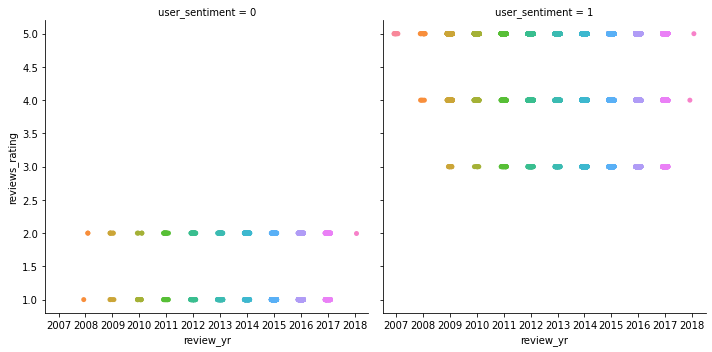

In [75]:
sns.catplot(data=df,x='review_yr',y='reviews_rating',col='user_sentiment')

- After the proper data cleaning, we can see that rating 1,2 are assigned for Negative sentiment and 3,4,5 are assigned to the positive user sentiment

- The columns required for the recommendations are username, rating, sentiment. Lets plot and verify the details

<AxesSubplot:xlabel='user_sentiment'>

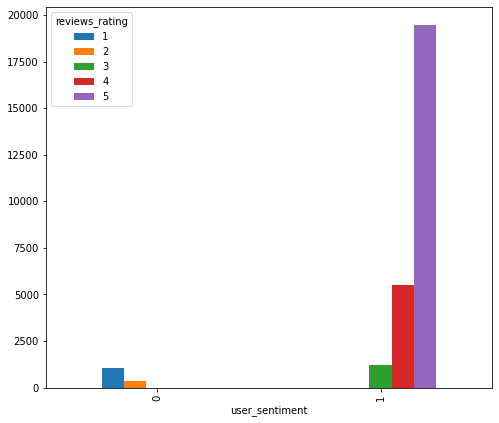

In [76]:
pd.pivot_table(data=df,values='reviews_username',columns='reviews_rating',
               index=['user_sentiment'],
               aggfunc='count').plot(kind='bar',figsize=(8,7))

- We see that there is very less record in the negative. We should be using class imbalance techniques for our analysis

<AxesSubplot:>

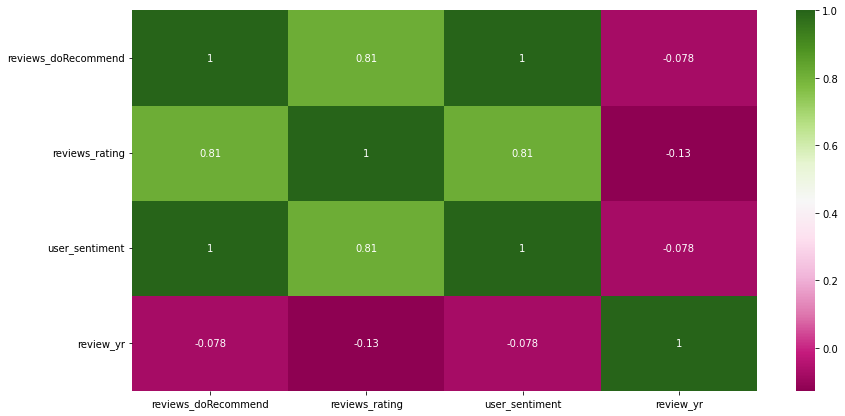

In [77]:
plt.figure(figsize = (14,7)) 
sns.heatmap(df.corr(),annot = True,cmap="PiYG")

# Text preprocessing

In [78]:
# verifying reviews_title for the high rating
df[(df['reviews_rating'].isin([3,4,5]) )]['reviews_title'].unique()[:10]

array(['Just Awesome', 'Good', 'Pretty nice', 'First time using',
       'We love it!', 'good times', 'Does the job', 'Loved',
       'Great sensation', 'That little extra something..'], dtype=object)

In [79]:
# verifying reviews_title for the high rating
df[(df['reviews_rating'].isin([1,2]))]['reviews_title'].unique()[:10]

array(['Disappointed', 'Irritation', 'Not worth it', 'Disappointing',
       'Not happy at all', 'Very disappointing', "Don't buy",
       'pretty dissapoitned', 'Waste of Money',
       'Not happy with this product'], dtype=object)

- It looks like it is properly splited. Lets view in word cloud

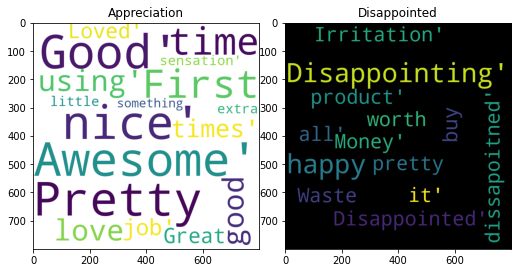

In [80]:
wordclouddisppointed = WordCloud(width = 800, height = 800,
                background_color ='black',
                stopwords = stop_words,
                min_font_size = 8,max_words=40).generate(str(df[(df['reviews_rating'].isin([1,2]))]['reviews_title'].unique()[:10]))
wordcloudappreciation = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 8,max_words=40).generate(str(df[(df['reviews_rating'].isin([3,4,5]))]['reviews_title'].unique()[:10]))

plt.figure(figsize = (7 ,7), facecolor = None)
plt.subplot(1, 2, 1)
plt.imshow(wordcloudappreciation)

plt.tight_layout(pad = 0)
plt.title("Appreciation")
plt.subplot(1, 2, 2)
plt.imshow(wordclouddisppointed)

plt.tight_layout(pad = 0)
plt.title("Disappointed")
plt.show()

### Text Preprocessing

- For the Text preprocessing/ tfIdf vectorization, we need the review content and the user sentiment

In [81]:
df_TextPreprocessing = df[['reviews_text','reviews_title','reviews_rating','user_sentiment']]

In [82]:
### We keep the title and text together are content
df_TextPreprocessing['review_content'] = df_TextPreprocessing['reviews_title'] + " " +df_TextPreprocessing['reviews_text']

In [83]:
### since title and text are already merged, we will remove that column
df_TextPreprocessing.drop(['reviews_text','reviews_title'],axis=1,inplace=True)
df_TextPreprocessing.head()

,reviews_rating,user_sentiment,review_content
0,5,1,Just Awesome i love this album. it's very good...
1,5,1,Good Good flavor. This review was collected as...
3,1,0,Disappointed I read through the reviews on her...
4,1,0,Irritation My husband bought this gel for us. ...
5,1,0,Not worth it My boyfriend and I bought this to...


In [84]:
### Lets check whether we have not in positive also. we can see not commonly used in positive sentiment also like not dry etc.
df_TextPreprocessing[df_TextPreprocessing['review_content'].str.contains("not|n\'t")]

,reviews_rating,user_sentiment,review_content
3,1,0,Disappointed I read through the reviews on her...
4,1,0,Irritation My husband bought this gel for us. ...
5,1,0,Not worth it My boyfriend and I bought this to...
7,1,0,Not happy at all I bought this product for my ...
8,1,0,Very disappointing My husband and I bought thi...
...,...,...,...
29992,5,1,Smells Amazing I absolutely love the smell of ...
29993,5,1,Ends feel so soft! I seriously was so surprise...
29994,5,1,"By far, my new favorite conditioner I got to t..."
29998,5,1,Perfect for my oily hair! I received this thro...


- Lets read the first positive comment with not. 

In [85]:
df_TextPreprocessing.loc[29992,'review_content']

"Smells Amazing I absolutely love the smell of this product! I have fine hair that is oily at the roots but the ends are dry. This left my hair feeling soft, the ends are not dry, and I didn't have to wash my hair last night (which I have to usually wash my hair every night). I couldn't be happier with this product and will most definitely be purchasing it again. I received these products free/complimentary for testing purposes, but all opinions are your own. This review was collected as part of a promotion."

- Lets read the negative comment with not. 

In [86]:
df_TextPreprocessing.loc[7,'review_content']

'Not happy at all I bought this product for my husband and I to try and we were not impressed at all. There was no tingling or warming. It left us both very sticky. I have used KY products in the past (loved KY his and hers) but this one was disappointing.'

- Lets clean the data

In [87]:
# Function to clean the text and remove all the unnecessary elements like punctuations, numbers and other chars.
def cleandata(text):
    text = text.lower()
    text = re.sub("[\(\[].*?[\)\]]", "", text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    return text

In [88]:
### Applying the text preprocessing step
df_TextPreprocessing['clean_review'] = pd.DataFrame(df_TextPreprocessing.review_content.apply(lambda x: cleandata(x)))
df_TextPreprocessing.head()

,reviews_rating,user_sentiment,review_content,clean_review
0,5,1,Just Awesome i love this album. it's very good...,just awesome i love this album its very good m...
1,5,1,Good Good flavor. This review was collected as...,good good flavor this review was collected as ...
3,1,0,Disappointed I read through the reviews on her...,disappointed i read through the reviews on her...
4,1,0,Irritation My husband bought this gel for us. ...,irritation my husband bought this gel for us t...
5,1,0,Not worth it My boyfriend and I bought this to...,not worth it my boyfriend and i bought this to...


- Lets apply lemmatization in the clean text 

In [89]:
### Function to lemmatize the sentence without stop words removal
def lemmatizer(text):        
    sentence = [wordnet_lemmatizer.lemmatize(word) for word in word_tokenize(text)]
    return " ".join(sentence)

In [90]:
### Function to lemmatize the sentence
#def lemmatizer(text):        
#    sentence = [wordnet_lemmatizer.lemmatize(word) for word in word_tokenize(text) if not word in stop_words]
#    return " ".join(sentence)

In [91]:
### Applying lemmatization for all the text in the dataframe
df_TextPreprocessing['lemma_review'] =  df_TextPreprocessing['clean_review'].apply(lambda x: lemmatizer(x))

In [92]:
df_TextPreprocessing.head()

,reviews_rating,user_sentiment,review_content,clean_review,lemma_review
0,5,1,Just Awesome i love this album. it's very good...,just awesome i love this album its very good m...,just awesome i love this album it very good mo...
1,5,1,Good Good flavor. This review was collected as...,good good flavor this review was collected as ...,good good flavor this review wa collected a pa...
3,1,0,Disappointed I read through the reviews on her...,disappointed i read through the reviews on her...,disappointed i read through the review on here...
4,1,0,Irritation My husband bought this gel for us. ...,irritation my husband bought this gel for us t...,irritation my husband bought this gel for u th...
5,1,0,Not worth it My boyfriend and I bought this to...,not worth it my boyfriend and i bought this to...,not worth it my boyfriend and i bought this to...


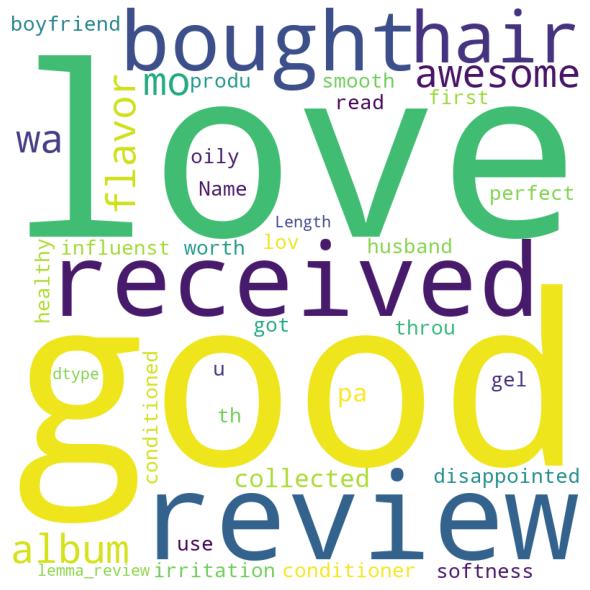

In [93]:
#### After lemmatization, lets check the most used words 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 8,max_words=40).generate(str(df_TextPreprocessing.lemma_review))

print(wordcloud)
plt.figure(figsize = (8 ,8), facecolor = None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)
plt.show()

- Now Lets plot the Unigram, Bigram and Trigram words

In [94]:
### Function to call any number of n-grams
def get_top_n_gram(corpus, gram=None, n=None):
    vec = CountVectorizer(ngram_range=(gram, gram), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

#### Unigram

<function matplotlib.pyplot.show(close=None, block=None)>

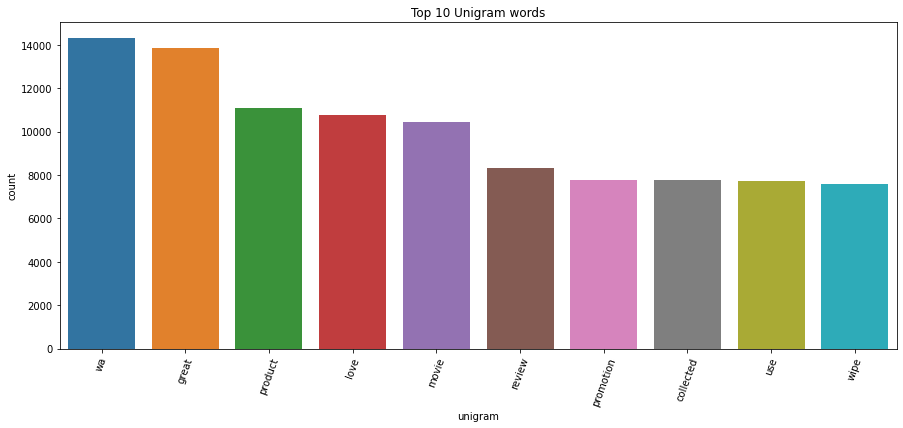

In [95]:
unigram_words = get_top_n_gram(df_TextPreprocessing.lemma_review,1, 30)
unigram_df = pd.DataFrame(unigram_words[:10], columns = ['unigram' , 'count'])
plt.figure(figsize = (15 ,6))
sns.barplot(data = unigram_df, x='unigram', y= 'count')
plt.xticks(rotation=70)
plt.title("Top 10 Unigram words")
plt.show

#### Bigram

<function matplotlib.pyplot.show(close=None, block=None)>

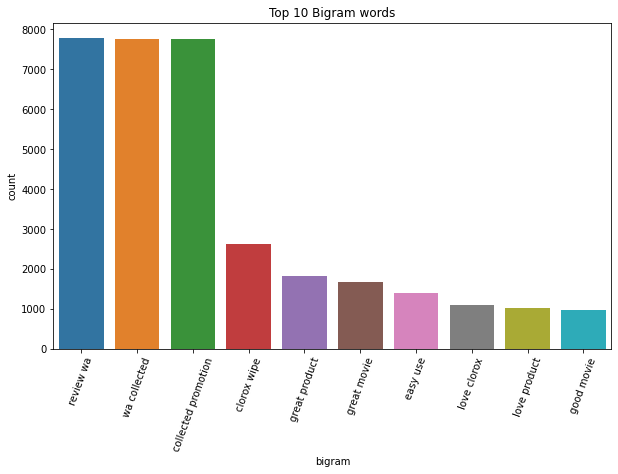

In [96]:
bigram_words = get_top_n_gram(df_TextPreprocessing.lemma_review,2, 30)
bigram_df = pd.DataFrame(bigram_words[:10], columns = ['bigram' , 'count'])
plt.figure(figsize = (10 ,6))
sns.barplot(data = bigram_df, x='bigram', y= 'count')
plt.xticks(rotation=70)
plt.title("Top 10 Bigram words")
plt.show

#### Trigram

<function matplotlib.pyplot.show(close=None, block=None)>

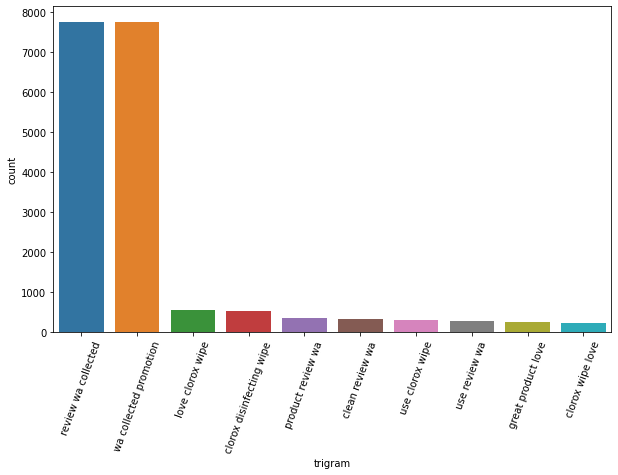

In [97]:
trigram_words = get_top_n_gram(df_TextPreprocessing.lemma_review,3, 30)
trigram_df = pd.DataFrame(trigram_words[:10], columns = ['trigram' , 'count'])
plt.figure(figsize = (10 ,6))
sns.barplot(data = trigram_df, x='trigram', y= 'count')
plt.xticks(rotation=70)
plt.show

In [98]:
(df['user_sentiment'].value_counts()/df['user_sentiment'].count())*100

1    94.802088
0     5.197912
Name: user_sentiment, dtype: float64

# Feature extraction

In [99]:
#Initialise the TfidfVectorizer 
tfidf = TfidfVectorizer(stop_words='english',max_df = 0.95,min_df = 2)

In [100]:
### Viewing the features list
dtm = tfidf.fit_transform(df_TextPreprocessing.lemma_review)
pd.DataFrame(dtm.toarray(), columns=tfidf.get_feature_names())

,aaron,ab,abc,abd,ability,able,abomination,abosolutely,abrasive,absence,absolute,absolutely,absolutley,absolutly,absorb,absorbed,absorbes,absorbing,absorbs,abundance,abundant,ac,academy,accent,accentuate,accept,acceptable,accepted,access,accessible,accessory,accessout,accident,accidental,accidentally,accidently,accompanying,accomplish,accomplished,according,accordingly,account,accountant,accounting,accumulates,accurate,accurately,accustom,accutane,acdc,ache,achieve,achieved,achievement,acid,acknowledge,acne,acquired,acrylic,act,acted,acting,action,actioncomedy,actionpacked,activate,active,activity,actor,actorsactresses,actress,actual,actually,actualy,acutally,ad,adam,adaptation,adapted,adapter,adaption,add,added,addicted,addicting,addiction,addictive,adding,addition,additional,additionally,additive,address,adequate,adequately,adhesive,adjust,adjustable,adjusted,adjuster,adjusting,adjustment,adjusts,administrative,admire,admission,admit,admittedly,adorable,adore,adult,advance,advanced,advantage,adventure,adverse,advertise,advertised,advertisement,advertising,advice,advise,advised,aerial,aerosol,aesthetic,affair,affect,affected,affective,afford,affordable,aficionado,afraid,africa,african,afro,afterlife,afternoon,aftertaste,afterward,age,aged,agedefy,agenda,agent,ageold,aggravate,aggressive,aging,ago,agony,agreat,agree,agreed,agreement,agrees,ahead,ahhh,ahmazing,ahoy,aid,aide,ailment,aim,aimed,aint,air,airborne,airbrush,aircraft,airdry,aired,airplane,airport,airspun,airy,aisle,aka,akin,al,ala,alan,alarm,alaska,albeit,alberto,album,alcohol,aldean,aldeans,alden,ale,alert,alex,alexander,alice,alien,align,alignment,alike,alittle,alive,allaround,allen,allergen,allergic,allergy,alleviate,alley,allinone,alll,allover,allow,allowed,allowing,allows,allpurpose,allstar,allthe,alltime,almond,aloe,alongside,alos,alot,alpha,alright,alter,altering,alternate,alternative,altitude,altogether,alwasy,alzheimers,amaze,amazed,amazes,amazing,amazingly,amazingness,amazingwould,amazon,amazoncom,ambi,amc,amd,america,american,...,weighing,weighs,weight,weighted,weightless,weird,welcome,welcomed,weld,welded,weleda,welland,welldefined,welldesigned,wellgood,wellmade,wellthe,wellwritten,wen,went,werent,west,western,wet,wether,wetness,wetter,weve,weveryone,whats,whatsoever,wheel,wheelchair,whell,whelming,wheres,whiff,whim,whip,whipe,whipes,whistle,whit,white,whiten,whitening,whitens,whiter,whod,wholeheartedly,wholesome,whomever,whove,whpes,wicked,wide,widely,wider,widescreen,width,wierd,wife,wil,wild,wildfire,william,williams,willing,willingness,willis,win,wind,winded,windex,window,windowsill,windshield,windtunnel,windy,wine,wing,winner,winning,winter,winwin,wipe,wiped,wipedown,wipeing,wipescleaning,wipeseasy,wipesi,wipesso,wipesthey,wipesuse,wipeups,wiping,wipng,wire,wired,wiry,wisdom,wise,wiser,wish,wished,wishing,wit,witch,withstand,witnessed,witty,wks,wnt,wo,woe,woke,woman,won,wonder,wondered,wonderful,wonderfull,wonderfully,wondering,wont,wood,wooden,woodstove,woodwe,woodwork,wool,word,wore,work,workable,workaholic,worked,worker,worki,working,workingwe,workmanship,workout,workplace,workshop,world,worldwide,worn,worried,worry,worrying,worse,worst,wort,worth,worthless,worthwhile,worthy,woud,wouldnt,wouldve,woulndt,wound,wow,wrap,wrapped,wreak,wrecking,wrench,wrestle,wrestled,wrestler,wrestling,wrinkle,wrinkled,wrist,write,writer,writing,written,wrong,wrote,wth,wyler,xmas,xx,ya,yall,yard,yay,yea,yeah,year,yearly,yearold,yearround,yearsand,yearsthe,yellow,yellowish,yes,yesterday,yesteryear,yield,yo,yogurt,yor,york,yorkies,youcleans,youd,youll,young,younger,youngest,youngster,youre,youth,youthful,youtube,youve,yr,yrold,ysl,yuck,yucky,yuk,yum,yummm,yummy,yup,zac,zach,zack,zero,zesty,zilla,zinc,zing,zip,zipcode,ziploc,ziplock,zipper,zojirushi,zombie,zombieaction,zone,zoo
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

- We will take only the lemma content and the corresponding user sentiments

In [101]:
training_data= df_TextPreprocessing[['lemma_review','user_sentiment']]

In [102]:
training_data.shape

(27588, 2)

In [103]:
X = training_data.lemma_review
y = training_data.user_sentiment

In [104]:
### splitting the data in xtrain and xtest
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


In [105]:
X.head()

0    just awesome i love this album it very good mo...
1    good good flavor this review wa collected a pa...
3    disappointed i read through the review on here...
4    irritation my husband bought this gel for u th...
5    not worth it my boyfriend and i bought this to...
Name: lemma_review, dtype: object

#### Transforming the data using TfIdf vectorizer

In [106]:
tfidf_transformer = TfidfVectorizer(ngram_range=(1,2))
tfidf_transformer.fit(X_train)
X_tfidf = tfidf_transformer.transform(X_train)
X_testtfidf = tfidf_transformer.transform(X_test)

#### TFIDF pickle

In [107]:
pickle.dump(tfidf_transformer, open("tfidfvec.pkl","wb"))


In [108]:
X_train = X_tfidf
X_test = X_testtfidf

#### Applying the Naive Bayes Model

In [109]:
from sklearn.naive_bayes import MultinomialNB

clf = MultinomialNB()
clf.fit(X_train,y_train)

y_pred = clf.predict(X_test)

from sklearn.metrics import accuracy_score,classification_report

clf_report = classification_report(y_test,y_pred)
print(F'ACC : {accuracy_score(y_test,y_pred)}')
print(clf_report)

ACC : 0.9507032042917211
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       340
           1       0.95      1.00      0.97      6557

    accuracy                           0.95      6897
   macro avg       0.48      0.50      0.49      6897
weighted avg       0.90      0.95      0.93      6897



- Accuracy is 95%
- Recal value is not good
- Lets veify few texts

In [110]:
### Negative text verification
texts = ['My husband and I bought this for some extra fun. We were both extremely disappointed. Especially for the price! Do not waste your money on this product. We felt nothing but a sticky mess from it.']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)

1
['My husband and I bought this for some extra fun. We were both extremely disappointed. Especially for the price! Do not waste your money on this product. We felt nothing but a sticky mess from it.']


 - Its wrongly classifyinf as positive statement. Its because, we have observed that there is less negative reocrds. We have trained the model with more positive records and less negative records. The model needs to be training more on negative records as well. Lets use some class imbalance techniques

In [111]:
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE
from collections import Counter

#SMOTE
smote = SMOTE(random_state=2)
x_train_sm, y_train_sm = smote.fit_resample(X_train,y_train)
print("The number of classes after SMOTE fit {}".format(Counter(y_train_sm)))
print("");
#Under Sampling
ns = NearMiss(0.8)
x_train_ns, y_train_ns = ns.fit_resample(X_train, y_train)
print("The number of classes after NearMiss fit {}".format(Counter(y_train_ns)))
print("");

os = RandomOverSampler(0.75)
x_train_os, y_train_os = os.fit_resample(X_train, y_train)
print("The number of classes after RandomOverSampler fit {}".format(Counter(y_train_os)))
print("");

sm = SMOTETomek(0.75)
x_train_smt, y_train_smt = sm.fit_resample(X_train, y_train)
print("The number of classes after SMOTETomek fit {}".format(Counter(y_train_smt)))
print("");


The number of classes after SMOTE fit Counter({1: 19597, 0: 19597})

The number of classes after NearMiss fit Counter({1: 1367, 0: 1094})

The number of classes after RandomOverSampler fit Counter({1: 19597, 0: 14697})

The number of classes after SMOTETomek fit Counter({1: 19597, 0: 14697})



In [112]:
y_train_smt.value_counts()

1    19597
0    14697
Name: user_sentiment, dtype: int64

In [113]:
y_train_sm.value_counts()

1    19597
0    19597
Name: user_sentiment, dtype: int64

#### Again apply the Naive Bayes Model

In [114]:
clf = MultinomialNB()
clf.fit(x_train_sm,y_train_sm)

y_pred = clf.predict(X_test)

from sklearn.metrics import accuracy_score,classification_report

clf_report = classification_report(y_test,y_pred)
print(F'ACC : {accuracy_score(y_test,y_pred)}')
print(clf_report)

ACC : 0.9109757865738727
              precision    recall  f1-score   support

           0       0.34      0.88      0.49       340
           1       0.99      0.91      0.95      6557

    accuracy                           0.91      6897
   macro avg       0.67      0.90      0.72      6897
weighted avg       0.96      0.91      0.93      6897



#### Lets verify with few texts

In [115]:
### Negative comment
texts = ['My husband and I bought this for some extra fun. We werevboth extremely disappointed. Especially for the price! Do not waste your money on this product. We felt nothing but a sticky mess from it.']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)

0
['My husband and I bought this for some extra fun. We werevboth extremely disappointed. Especially for the price! Do not waste your money on this product. We felt nothing but a sticky mess from it.']


In [116]:
### Positive comment with not
texts = ['I love it amazing on my skin is so smooth nd not crack at all']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)

1
['I love it amazing on my skin is so smooth nd not crack at all']


In [117]:
### Negative comment
texts = ['I am disappointed']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)


0
['I am disappointed']


In [118]:
### Positive comment
texts = ['Great product']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)

1
['Great product']


In [119]:
### Negative comment
texts = ['It is not a good product. I donot recommend']

text_features = tfidf_transformer.transform(texts)
predictions = clf.predict(text_features)
print(predictions[0])
print(texts)

0
['It is not a good product. I donot recommend']


#### Now its working properly. Lets build other models as well and check which model has high accuracy

- After multiple runs with the grid search CV, placed only the hypertuned params which has the high accuracy.
- I have removed all the gridsearch CV from this notebook to save some space and runtime of the notebook

# Training a text classification model

- I have analysed many models with different hyperparameter tuning in the grid search CV.
- I have removed all those steps to save the run time and placed only the high values observed in the hyperparameter tuning

In [120]:
### Few finalised models from different classifier model

dict_classifiers_selected = {    
    "Basic_LogisticRegression":LogisticRegression(),
    "ClassBalance_LogisticRegression": LogisticRegression(class_weight='balanced'),
    "DecisionTreeClassifier" : DecisionTreeClassifier(max_depth=20, min_samples_leaf=5, random_state=42),
    "RandomForest": RandomForestClassifier(max_depth=35, min_samples_leaf=5, n_jobs=-1,
                       random_state=42),    
    "GradiantBoosting": GradientBoostingClassifier(learning_rate=0.6, max_depth=2, n_estimators=100, subsample=0.9)
    
    

}

In [121]:
from numpy import argmax

no_classifiers = len(dict_classifiers_selected.keys())

def classify_and_score(xtrain,ytrain,xtest,ytest):
    plt.figure(figsize=(15, 15))
    
    df_results = pd.DataFrame(data=np.zeros(shape=(no_classifiers,11)), columns = ['classifier', 'train_score', 'test_score', 'Train Recall', 'Test Recall','Train Precision','Test Precision','Train F1','Test F1',"ROC_AUC", "MCC" ])
    count = 0
    
    #ROC curve baseline
    ns_probs = [0 for _ in range(len(ytest))]
    ns_fpr, ns_tpr, _ = roc_curve(ytest, ns_probs)
    plt.subplot(2,1,1)
    plt.plot([0,1],[0,1],'r--')

    
    #Precision Recall curve baseline
    baseline_model = sum(ytest == 1) / len(ytest)
    plt.subplot(2,1,2)
    plt.plot([0, 1], [baseline_model, baseline_model], linestyle='--', label='Baseline model')

        
    for key, classifier in dict_classifiers_selected.items():
        tmp = classifier.fit(xtrain, ytrain)
        
        y_train_predict = classifier.predict(xtrain)
        y_test_predict = classifier.predict(xtest)
    
        #Precision Recall curve
        probs_lr = classifier.predict_proba(xtest)[:, 1]
        precision_lr, recall_lr, thresholds = precision_recall_curve(ytest, probs_lr)
        auc_lr = auc(recall_lr, precision_lr)

        fscore = (2 * precision_lr * recall_lr) / (precision_lr + recall_lr)
        # locate the index of the largest f score
        ix = argmax(fscore)
        print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

        plt.subplot(2,1,2)
        plt.plot(recall_lr, precision_lr, label=f'AUC ${key} = {auc_lr:.2f}')
        plt.scatter(recall_lr[ix], precision_lr[ix], marker='o', color='black', label='Best')

        df_results.loc[count,'classifier'] = key
        df_results.loc[count,'train_score'] = accuracy_score(ytrain,y_train_predict)
        df_results.loc[count,'test_score'] = accuracy_score(ytest, y_test_predict)
        df_results.loc[count,'Train Recall'] = recall_score(ytrain,y_train_predict,average='weighted')
        df_results.loc[count,'Test Recall'] = recall_score(ytest,y_test_predict,average='weighted')        
        df_results.loc[count,'Train Precision'] = precision_score(ytrain,y_train_predict,average='weighted')
        df_results.loc[count,'Test Precision'] = precision_score(ytest,y_test_predict,average='weighted')
        df_results.loc[count,'Train F1'] = f1_score(ytrain,y_train_predict,average='weighted')
        df_results.loc[count,'Test F1'] = f1_score(ytest,y_test_predict,average='weighted')     

        
        mcc = matthews_corrcoef(ytest, y_test_predict)  
        
        #ROC Recall curve
        fpr, tpr, thresholds = roc_curve(ytest, y_test_predict)
        roc_auc = auc(fpr,tpr)
        
        plt.subplot(2,1,1)
        plt.plot(fpr, tpr, marker='.', label=f'AUC ${key} = {roc_auc:.2f}')
      

        
        df_results.loc[count,'ROC_AUC'] =   roc_auc     
        df_results.loc[count,'MCC'] = mcc      
        count+=1
   
    plt.subplot(2,1,1)
    plt.title('ROC Curv', size=20)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend();

    plt.subplot(2,1,2)
    plt.title('Precision-Recall Curve', size=20)
    plt.xlabel('Recall', size=14)
    plt.ylabel('Precision', size=14)
    plt.legend();
    
    
    return df_results


#### Without any class imbalance checking the model performance

Label encoded data set
-------------------------------------------
Best Threshold=0.783693, F-Score=0.985
Best Threshold=0.281395, F-Score=0.986
Best Threshold=0.111111, F-Score=0.979
Best Threshold=0.812588, F-Score=0.983
Best Threshold=0.329634, F-Score=0.980


,classifier,train_score,test_score,Train Recall,Test Recall,Train Precision,Test Precision,Train F1,Test F1,ROC_AUC,MCC
0,Basic_LogisticRegression,0.968150,0.966942,0.968150,0.966942,0.968599,0.965449,0.961780,0.960014,0.680044,0.564778
1,ClassBalance_LogisticRegression,0.981828,0.958098,0.981828,0.958098,0.986350,0.968212,0.983050,0.961811,0.887331,0.647339
2,DecisionTreeClassifier,0.977285,0.956648,0.977285,0.956648,0.975984,0.952041,0.975633,0.953850,0.712277,0.483454
3,RandomForest,0.954908,0.954763,0.954908,0.954763,0.956400,0.955300,0.938794,0.936335,0.542571,0.280085
4,GradiantBoosting,0.975642,0.960708,0.975642,0.960708,0.974224,0.957236,0.974568,0.958592,0.742298,0.539961


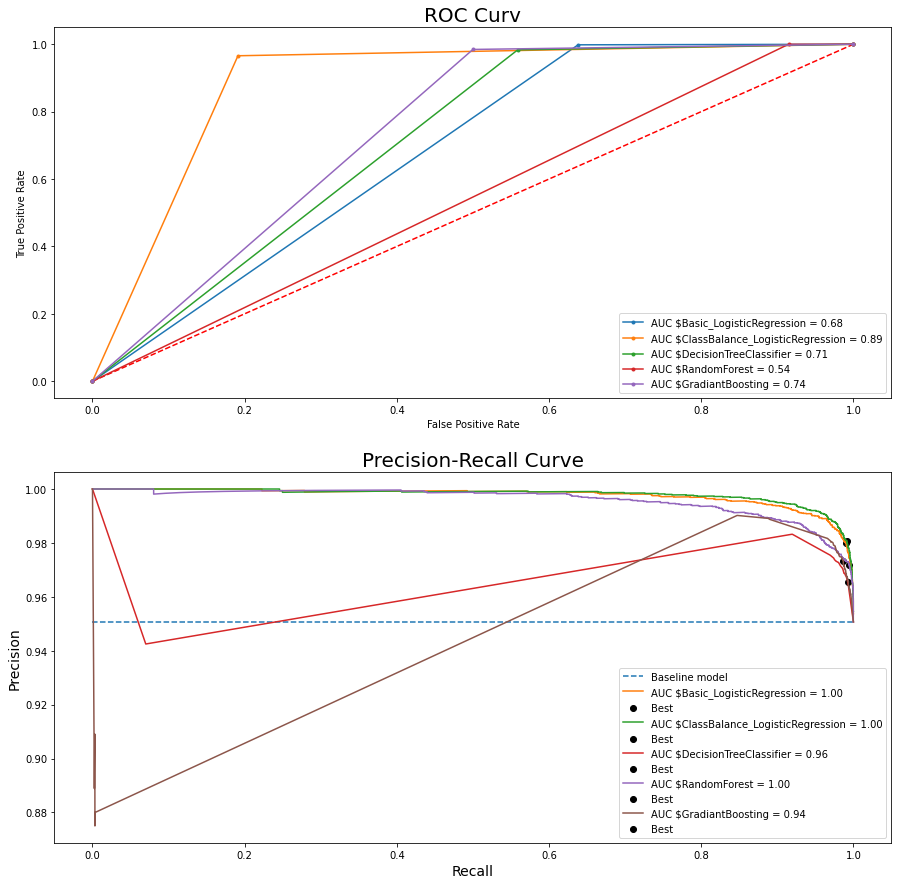

In [122]:
print("Label encoded data set")
print("-------------------------------------------")
res1 = classify_and_score(X_train, y_train,X_test, y_test)
res1

#### Applying smotek technique and checking the model performance

SMOTETomek on label encoder
-------------------------------------------
Best Threshold=0.342421, F-Score=0.986
Best Threshold=0.302410, F-Score=0.986
Best Threshold=0.029957, F-Score=0.975
Best Threshold=0.396926, F-Score=0.981
Best Threshold=0.236916, F-Score=0.981


,classifier,train_score,test_score,Train Recall,Test Recall,Train Precision,Test Precision,Train F1,Test F1,ROC_AUC,MCC
0,Basic_LogisticRegression,0.991835,0.968102,0.991835,0.968102,0.991853,0.969905,0.991838,0.968900,0.856340,0.677875
1,ClassBalance_LogisticRegression,0.991223,0.964912,0.991223,0.964912,0.991296,0.969679,0.991230,0.966804,0.874183,0.671530
2,DecisionTreeClassifier,0.972298,0.942584,0.972298,0.942584,0.972324,0.946066,0.972272,0.944232,0.724401,0.423731
3,RandomForest,0.954394,0.958098,0.954394,0.958098,0.956721,0.951152,0.954063,0.952840,0.678181,0.460875
4,GradiantBoosting,0.979763,0.955343,0.979763,0.955343,0.979769,0.954232,0.979765,0.954766,0.749237,0.511516


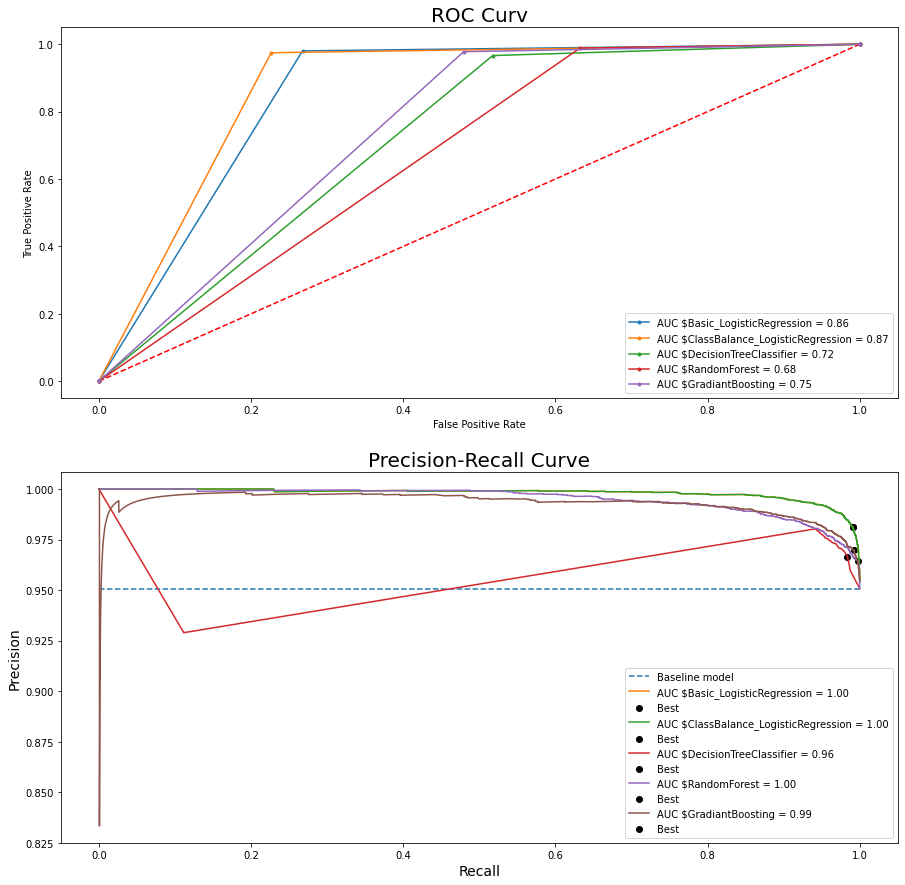

In [123]:
print("SMOTETomek on label encoder")
print("-------------------------------------------")
res2 = classify_and_score(x_train_smt,y_train_smt,X_test, y_test)
res2

#### Applying RandomOverSampler technique and checking the model performance

RandomOverSampler on label encoder
-------------------------------------------
Best Threshold=0.292145, F-Score=0.987
Best Threshold=0.254098, F-Score=0.987
Best Threshold=0.076923, F-Score=0.977
Best Threshold=0.439889, F-Score=0.983
Best Threshold=0.156380, F-Score=0.982


,classifier,train_score,test_score,Train Recall,Test Recall,Train Precision,Test Precision,Train F1,Test F1,ROC_AUC,MCC
0,Basic_LogisticRegression,0.993089,0.968102,0.993089,0.968102,0.993139,0.971146,0.993094,0.969359,0.873072,0.689464
1,ClassBalance_LogisticRegression,0.991690,0.963317,0.991690,0.963317,0.991814,0.969389,0.991698,0.965660,0.878921,0.666404
2,DecisionTreeClassifier,0.947950,0.921270,0.947950,0.921270,0.948798,0.949328,0.948068,0.932473,0.791274,0.433750
3,RandomForest,0.913950,0.965202,0.913950,0.965202,0.923724,0.960837,0.912308,0.961411,0.726536,0.565674
4,GradiantBoosting,0.973377,0.942149,0.973377,0.942149,0.974555,0.960336,0.973451,0.949007,0.853845,0.555088


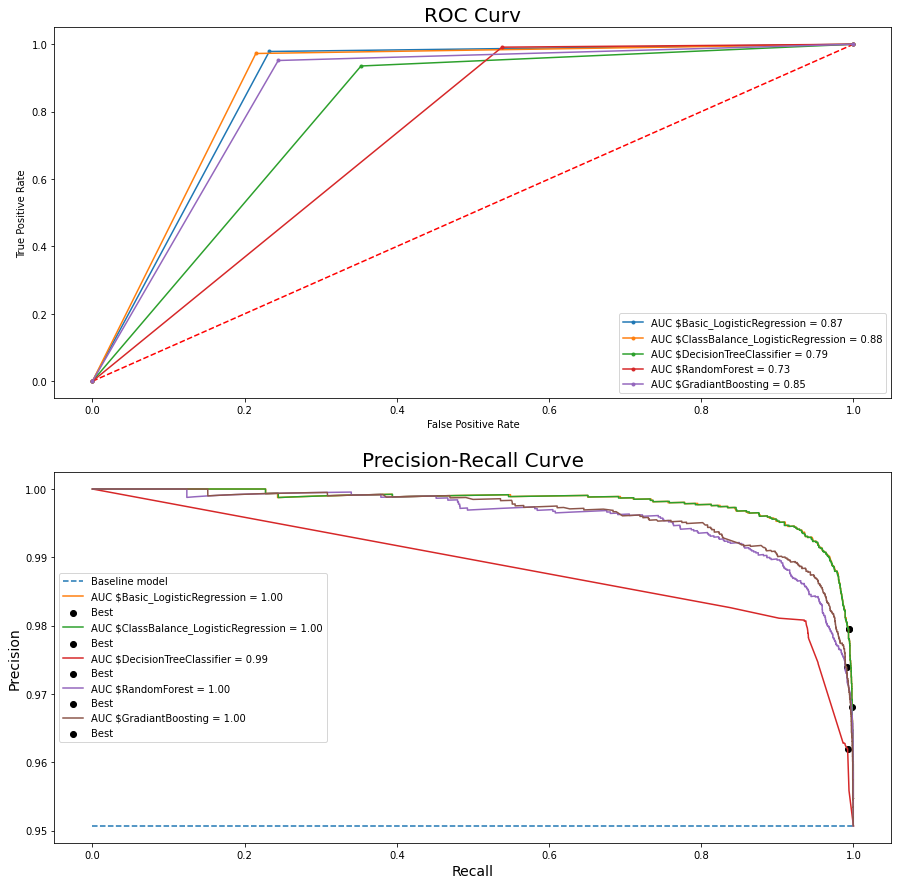

In [124]:
print("RandomOverSampler on label encoder")
print("-------------------------------------------")
res3 = classify_and_score(x_train_os,y_train_os,X_test, y_test)
res3

#### Applying smote technique and checking the model performance

SMOTE on label encoder
-------------------------------------------
Best Threshold=0.289919, F-Score=0.986
Best Threshold=0.289919, F-Score=0.986
Best Threshold=0.022036, F-Score=0.975
Best Threshold=0.367639, F-Score=0.980
Best Threshold=0.084012, F-Score=0.981


,classifier,train_score,test_score,Train Recall,Test Recall,Train Precision,Test Precision,Train F1,Test F1,ROC_AUC,MCC
0,Basic_LogisticRegression,0.992805,0.964912,0.992805,0.964912,0.992840,0.969098,0.992805,0.966613,0.867211,0.666340
1,ClassBalance_LogisticRegression,0.992805,0.964912,0.992805,0.964912,0.992840,0.969098,0.992805,0.966613,0.867211,0.666340
2,DecisionTreeClassifier,0.974333,0.934174,0.974333,0.934174,0.974340,0.946403,0.974333,0.939500,0.747864,0.420934
3,RandomForest,0.960530,0.955778,0.960530,0.955778,0.961988,0.950823,0.960499,0.952762,0.704847,0.470038
4,GradiantBoosting,0.981451,0.953458,0.981451,0.953458,0.981458,0.954436,0.981451,0.953934,0.762189,0.513769


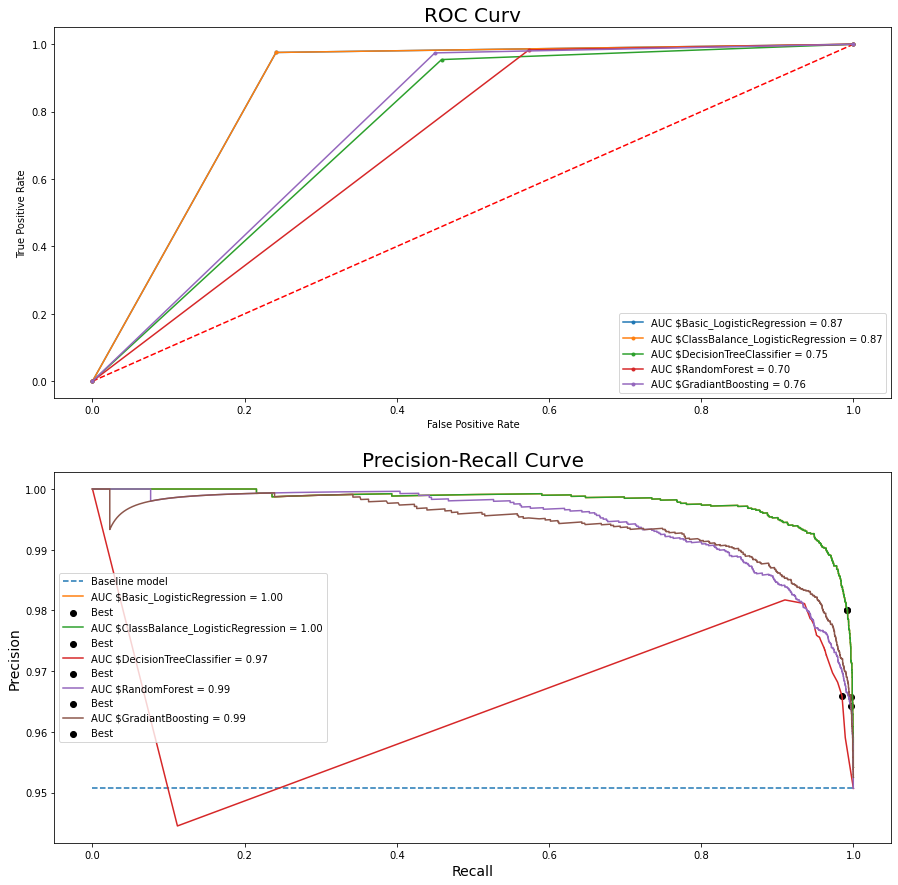

In [125]:
print("SMOTE on label encoder")
print("-------------------------------------------")
res4 = classify_and_score(x_train_sm,y_train_sm,X_test, y_test)
res4

- From the above Analysis, we can see that Logistic regression in the SMOTE data is working better than any other model.
- Its probable that the data variation is not high that the logistic is performing better.

In [126]:
## We will take the logistic Model as the final model
final_model = LogisticRegression(class_weight='balanced')
final_model.fit(x_train_sm,y_train_sm)

y_prob_test=final_model.predict_proba(X_test)
y_pred_test=final_model.predict(X_test)
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.62      0.76      0.68       340
           1       0.99      0.98      0.98      6557

    accuracy                           0.96      6897
   macro avg       0.80      0.87      0.83      6897
weighted avg       0.97      0.96      0.97      6897



In [127]:
accuracy_score(y_test, y_pred_test)

0.9649122807017544

<AxesSubplot:>

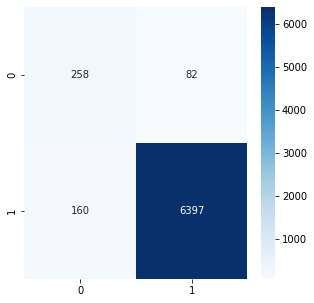

In [128]:
# Display confusion matrix
conf_mat = confusion_matrix(y_test, y_pred_test)
df_conf_mat = pd.DataFrame(conf_mat)
plt.figure(figsize = (5,5))
sns.heatmap(df_conf_mat, annot=True,cmap='Blues', fmt='g')

#### Creating pickle of the best model

In [129]:
filename = 'LogisticClassifier_model.pkl'
pickle.dump(final_model, open(filename, 'wb'))

# Building a recommendation system

In [130]:
## the basic data set after the data cleaning
df.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,review_yr
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30 06:21:45,True,5,i love this album. it's very good. more to the...,Just Awesome,joshua,1,2012
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09 00:00:00,True,5,Good flavor. This review was collected as part...,Good,dorothy w,1,2017
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06 00:00:00,False,1,I read through the reviews on here before look...,Disappointed,rebecca,0,2016
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21 00:00:00,False,1,My husband bought this gel for us. The gel cau...,Irritation,walker557,0,2016
5,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-04-20 00:00:00,False,1,My boyfriend and I bought this to spice things...,Not worth it,samantha,0,2016


- We will take only the required field for the sentiment analysis

In [131]:
sentiment_df = df[['id','brand', 'name', 'categories','manufacturer','reviews_text','reviews_title','reviews_rating','reviews_username','user_sentiment']]
sentiment_df.head()

,id,brand,name,categories,manufacturer,reviews_text,reviews_title,reviews_rating,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,i love this album. it's very good. more to the...,Just Awesome,5,joshua,1
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Good flavor. This review was collected as part...,Good,5,dorothy w,1
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,I read through the reviews on here before look...,Disappointed,1,rebecca,0
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,My husband bought this gel for us. The gel cau...,Irritation,1,walker557,0
5,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,My boyfriend and I bought this to spice things...,Not worth it,1,samantha,0


In [132]:
sentiment_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27588 entries, 0 to 29999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                27588 non-null  object
 1   brand             27588 non-null  object
 2   name              27588 non-null  object
 3   categories        27588 non-null  object
 4   manufacturer      27588 non-null  object
 5   reviews_text      27588 non-null  object
 6   reviews_title     27588 non-null  object
 7   reviews_rating    27588 non-null  int64 
 8   reviews_username  27588 non-null  object
 9   user_sentiment    27588 non-null  int64 
dtypes: int64(2), object(8)
memory usage: 3.3+ MB


- Since we have done the data cleaning, there is no null values and the final dataset has 27588 records.

- Verifying the Total ratings provided for the products

In [133]:
sentiment_df.groupby('name')['reviews_rating'].count().reset_index().sort_values('reviews_rating', ascending=False)[:10]

,name,reviews_rating
65,Clorox Disinfecting Wipes Value Pack Scented 1...,7786
93,Godzilla 3d Includes Digital Copy Ultraviolet ...,3148
64,Clorox Disinfecting Bathroom Cleaner,1893
183,Planes: Fire Rescue (2 Discs) (includes Digita...,1097
41,"Burt's Bees Lip Shimmer, Raisin",873
239,The Resident Evil Collection 5 Discs (blu-Ray),821
129,L'or233al Paris Elvive Extraordinary Clay Reba...,789
151,Mike Dave Need Wedding Dates (dvd + Digital),716
200,Red (special Edition) (dvdvideo),660
157,My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Di...,650


- We can see that there are single rating as well. But we cannot remove this. This might be new products and might need user to try it.

In [134]:
Item_ratedf = sentiment_df.groupby('name')['reviews_rating'].count().reset_index().sort_values('reviews_rating', ascending=False)
Item_ratedf.tail()

,name,reviews_rating
193,Progresso Traditional Chicken Rice With Vegeta...,1
203,Roommates No Place Like Home Peel Stick Wall D...,1
43,Cal Lighting Led Dark Bronze Finish Metal Pian...,1
37,"Bodycology Nourishing Body Cream, Pretty In Paris",1
174,Pacific Natural Foods Organic Beef Broth,1


- Getting the list of users and the number of ratings provided by the user/

In [135]:
sentiment_df.groupby('reviews_username')['reviews_rating'].count().reset_index().sort_values('reviews_rating', ascending=False)[:10]

,reviews_username,reviews_rating
15805,mike,17
13806,lisa,15
4749,chris,13
20300,sandy,12
19558,rick,12
10082,james,11
11349,jojo,11
10569,jenn,11
13321,laura,10
15063,mary,10


- We assume that the users who have purchased the product only have provided the comments for the products

### Creating recommendation system for the user-based and Item based
- We will try atleast 2 different techniques for each of the recommendation model and decide the best out of it.

# User Based Recommendation System

#### For Sentiment Analysis we need mainly the 'Id' of the product, 'rating' and 'username'

### User Based Recommendation - Model1

## Modelling User Based with SVD model

- To model with the SVD model, we will take in the df which is cleaned

### Matrix Factorization-based algorithms
#### SVD
    - SVD algorithm is equivalent to Probabilistic Matrix Factorization
    We use rmse as our accuracy metric for the predictions.

In [136]:
sentiment_df.head()

,id,brand,name,categories,manufacturer,reviews_text,reviews_title,reviews_rating,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,i love this album. it's very good. more to the...,Just Awesome,5,joshua,1
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Good flavor. This review was collected as part...,Good,5,dorothy w,1
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,I read through the reviews on here before look...,Disappointed,1,rebecca,0
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,My husband bought this gel for us. The gel cau...,Irritation,1,walker557,0
5,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,My boyfriend and I bought this to spice things...,Not worth it,1,samantha,0


- We will take only the required field[product id, reviews_rating, reviews_username'] for the sentiment analysis

In [137]:
surprise_df = df[['id','reviews_rating','reviews_username']]
surprise_df.head()

,id,reviews_rating,reviews_username
0,AV13O1A8GV-KLJ3akUyj,5,joshua
1,AV14LG0R-jtxr-f38QfS,5,dorothy w
3,AV16khLE-jtxr-f38VFn,1,rebecca
4,AV16khLE-jtxr-f38VFn,1,walker557
5,AV16khLE-jtxr-f38VFn,1,samantha


In [138]:
from surprise import SVD
from surprise import Dataset
from surprise import Reader
from collections import defaultdict

- To load a dataset from a pandas dataframe, we will use the load_from_df() method, we will also need a Reader object, and the rating_scale parameter must be specified. The dataframe must have three columns, corresponding to the user ids, the item ids, and the ratings in this order. Each row thus corresponds to a given rating.

In [139]:
reader = Reader(rating_scale=(1,5))

In [140]:
data = Dataset.load_from_df(surprise_df[['reviews_username','id','reviews_rating']], reader)

### Points to Note:
1) Trainset is no longer a pandas dataframe. Rather, it's a specific datatypes defined by the Surprise library


2) reviews_username and id in the pandas dataframe can contain any value (either string/integer etc). However, Trainset convert these raw ids into numeric indexes called as "inner id"


3) Methods are provided to convert raw id to inner id and vice versa

In [141]:
trainset = data.build_full_trainset()

In [142]:
trainset.ur

defaultdict(list,
            {0: [(0, 5.0), (34, 3.0), (87, 4.0), (127, 5.0), (225, 5.0)],
             1: [(1, 5.0)],
             2: [(2, 1.0),
              (6, 5.0),
              (88, 3.0),
              (90, 5.0),
              (172, 5.0),
              (203, 5.0),
              (249, 5.0),
              (269, 5.0)],
             3: [(2, 1.0)],
             4: [(2, 1.0), (36, 5.0), (122, 5.0)],
             5: [(2, 1.0)],
             6: [(2, 1.0), (99, 5.0), (228, 4.0)],
             7: [(2, 1.0), (32, 5.0), (241, 4.0)],
             8: [(2, 1.0)],
             9: [(2, 1.0)],
             10: [(2, 1.0)],
             11: [(2, 1.0)],
             12: [(2, 1.0), (70, 5.0), (72, 5.0), (240, 5.0)],
             13: [(2, 1.0)],
             14: [(2, 1.0)],
             15: [(2, 1.0)],
             16: [(2, 3.0)],
             17: [(2, 3.0)],
             18: [(2, 4.0)],
             19: [(2, 4.0)],
             20: [(2, 4.0)],
             21: [(2, 5.0)],
             22: [(2, 5.0)]

- The dictionary list have the users as 'key' and the product, ratings which was purchased by user is the values

In [143]:
algo = SVD()
algo.fit(trainset)

In [144]:
# The build_anti_testset() method will generate the testdata by itself
testset = trainset.build_anti_testset()

In [145]:
testset

[('joshua', 'AV14LG0R-jtxr-f38QfS', 4.5186675366101205),
 ('joshua', 'AV16khLE-jtxr-f38VFn', 4.5186675366101205),
 ('joshua', 'AV1d76w7vKc47QAVhCqn', 4.5186675366101205),
 ('joshua', 'AV1h6gSl-jtxr-f31p40', 4.5186675366101205),
 ('joshua', 'AV1h6Gu0glJLPUi8IjA_', 4.5186675366101205),
 ('joshua', 'AV1l8zRZvKc47QAVhnAv', 4.5186675366101205),
 ('joshua', 'AV1YGDqsGV-KLJ3adc-O', 4.5186675366101205),
 ('joshua', 'AV1YIch7GV-KLJ3addeG', 4.5186675366101205),
 ('joshua', 'AV1YlENIglJLPUi8IHsX', 4.5186675366101205),
 ('joshua', 'AV1YmBrdGV-KLJ3adewb', 4.5186675366101205),
 ('joshua', 'AV1YmDL9vKc47QAVgr7_', 4.5186675366101205),
 ('joshua', 'AV1Ymf_rglJLPUi8II2v', 4.5186675366101205),
 ('joshua', 'AV1Yn94nvKc47QAVgtst', 4.5186675366101205),
 ('joshua', 'AV1Ynb3bglJLPUi8IJxJ', 4.5186675366101205),
 ('joshua', 'AV1YneDPglJLPUi8IJyQ', 4.5186675366101205),
 ('joshua', 'AV1YnUMYglJLPUi8IJpK', 4.5186675366101205),
 ('joshua', 'AV1Yo6FPglJLPUi8IK3u', 4.5186675366101205),
 ('joshua', 'AV1YpiJvvKc47QAVgu

- Test the predictions trained by the model

In [146]:
SVD_predictions = algo.test(testset)

In [147]:
SVD_predictions

[Prediction(uid='joshua', iid='AV14LG0R-jtxr-f38QfS', r_ui=4.5186675366101205, est=4.331419120734285, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV16khLE-jtxr-f38VFn', r_ui=4.5186675366101205, est=2.823877013203649, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV1d76w7vKc47QAVhCqn', r_ui=4.5186675366101205, est=4.8028881475492256, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV1h6gSl-jtxr-f31p40', r_ui=4.5186675366101205, est=4.603325093116194, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV1h6Gu0glJLPUi8IjA_', r_ui=4.5186675366101205, est=3.9607651573538645, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV1l8zRZvKc47QAVhnAv', r_ui=4.5186675366101205, est=4.740490077191102, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='AV1YGDqsGV-KLJ3adc-O', r_ui=4.5186675366101205, est=4.804660604637784, details={'was_impossible': False}),
 Prediction(uid='joshua', iid='A

In [148]:
from surprise import accuracy

- To calculate the RMSE value

In [149]:
# compute RMSE
svcpred = accuracy.rmse(SVD_predictions)
svcpred

RMSE: 0.3566


0.3566464138524048

In [150]:
# result_df is created with the values
result_df = pd.DataFrame(columns=('Model', 'RMSE'))
result_df.loc[0] = ['SVDAutobuldTestset',svcpred]
result_df

,Model,RMSE
0,SVDAutobuldTestset,0.356646


### Top 20 List of products for the user Testing

In [151]:
### function to get the top required predictions
def get_top_n(predictions, n=10):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [152]:
### Getting the top 20 predictions
top_20 = get_top_n(SVD_predictions, n=20)

- Printing the top 20 list which has the username and top20 products list

In [153]:
top_20

defaultdict(list,
            {'joshua': [('AVpfPaoqLJeJML435Xk9', 4.949822152387875),
              ('AVpf3VOfilAPnD_xjpun', 4.915099152175817),
              ('AVpfJP1C1cnluZ0-e3Xy', 4.889470696112262),
              ('AVpe41TqilAPnD_xQH3d', 4.862226885138714),
              ('AVpf4oLxLJeJML43FcxC', 4.858027928604948),
              ('AVpfVPh3ilAPnD_xZzW9', 4.831162994201416),
              ('AVpfCuzrilAPnD_xTroT', 4.822753570441085),
              ('AVpfAgSp1cnluZ0-b2-K', 4.811977428819704),
              ('AVpf0eb2LJeJML43EVSt', 4.8056181150613755),
              ('AV1YGDqsGV-KLJ3adc-O', 4.804660604637784),
              ('AVpfbkyr1cnluZ0-kozI', 4.804014467552816),
              ('AV1d76w7vKc47QAVhCqn', 4.8028881475492256),
              ('AVpfRTh1ilAPnD_xYic2', 4.7958651306438425),
              ('AVpf--o9LJeJML43G_Fq', 4.7854299527601825),
              ('AVpfNWbPilAPnD_xXPR7', 4.783511995770357),
              ('AVpf5olc1cnluZ0-tPrO', 4.769552855737204),
              ('AVpfNfEM

- Will run for the user 'joshua'as example

In [154]:
top_20['joshua']

[('AVpfPaoqLJeJML435Xk9', 4.949822152387875),
 ('AVpf3VOfilAPnD_xjpun', 4.915099152175817),
 ('AVpfJP1C1cnluZ0-e3Xy', 4.889470696112262),
 ('AVpe41TqilAPnD_xQH3d', 4.862226885138714),
 ('AVpf4oLxLJeJML43FcxC', 4.858027928604948),
 ('AVpfVPh3ilAPnD_xZzW9', 4.831162994201416),
 ('AVpfCuzrilAPnD_xTroT', 4.822753570441085),
 ('AVpfAgSp1cnluZ0-b2-K', 4.811977428819704),
 ('AVpf0eb2LJeJML43EVSt', 4.8056181150613755),
 ('AV1YGDqsGV-KLJ3adc-O', 4.804660604637784),
 ('AVpfbkyr1cnluZ0-kozI', 4.804014467552816),
 ('AV1d76w7vKc47QAVhCqn', 4.8028881475492256),
 ('AVpfRTh1ilAPnD_xYic2', 4.7958651306438425),
 ('AVpf--o9LJeJML43G_Fq', 4.7854299527601825),
 ('AVpfNWbPilAPnD_xXPR7', 4.783511995770357),
 ('AVpf5olc1cnluZ0-tPrO', 4.769552855737204),
 ('AVpfNfEMLJeJML434uf-', 4.765737389441548),
 ('AVpf0YhQLJeJML43ETff', 4.7589636633470604),
 ('AVpfGRUHilAPnD_xU5nU', 4.7542809261312815),
 ('AVpfov9TLJeJML43A7B0', 4.749069850709742)]

- Getting the list of product id for the user joshua

In [155]:
list_prod = []
for uid, user_ratings in top_20.items():
    if(uid == 'joshua'):
        list_prod = [iid for (iid, rating) in user_ratings]
        break;
print(list_prod)

['AVpfPaoqLJeJML435Xk9', 'AVpf3VOfilAPnD_xjpun', 'AVpfJP1C1cnluZ0-e3Xy', 'AVpe41TqilAPnD_xQH3d', 'AVpf4oLxLJeJML43FcxC', 'AVpfVPh3ilAPnD_xZzW9', 'AVpfCuzrilAPnD_xTroT', 'AVpfAgSp1cnluZ0-b2-K', 'AVpf0eb2LJeJML43EVSt', 'AV1YGDqsGV-KLJ3adc-O', 'AVpfbkyr1cnluZ0-kozI', 'AV1d76w7vKc47QAVhCqn', 'AVpfRTh1ilAPnD_xYic2', 'AVpf--o9LJeJML43G_Fq', 'AVpfNWbPilAPnD_xXPR7', 'AVpf5olc1cnluZ0-tPrO', 'AVpfNfEMLJeJML434uf-', 'AVpf0YhQLJeJML43ETff', 'AVpfGRUHilAPnD_xU5nU', 'AVpfov9TLJeJML43A7B0']


- Getting the ratings from the dataframe to find the number of positive ratings provided for the product by the user

In [156]:
filter_top20 = df[df['id'].isin(list_prod)][['id','brand','categories','name','reviews_rating']]

In [157]:
filter_top20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)

,id,sum,mean,count
1,AV1d76w7vKc47QAVhCqn,30,5.000000,6
11,AVpfGRUHilAPnD_xU5nU,25,5.000000,5
14,AVpfNfEMLJeJML434uf-,50,5.000000,10
4,AVpf0YhQLJeJML43ETff,167,4.911765,34
9,AVpfAgSp1cnluZ0-b2-K,426,4.896552,87
7,AVpf4oLxLJeJML43FcxC,1295,4.886792,265
13,AVpfNWbPilAPnD_xXPR7,122,4.880000,25
12,AVpfJP1C1cnluZ0-e3Xy,9180,4.849445,1893
6,AVpf3VOfilAPnD_xjpun,37513,4.818007,7786
8,AVpf5olc1cnluZ0-tPrO,833,4.815029,173


In [158]:
calculatepercent = filter_top20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)

In [159]:
calculatepercent['percent'] = calculatepercent['mean'].apply(lambda x: (x/5)*100)
calculatepercent

,id,sum,mean,count,percent
1,AV1d76w7vKc47QAVhCqn,30,5.000000,6,100.000000
11,AVpfGRUHilAPnD_xU5nU,25,5.000000,5,100.000000
14,AVpfNfEMLJeJML434uf-,50,5.000000,10,100.000000
4,AVpf0YhQLJeJML43ETff,167,4.911765,34,98.235294
9,AVpfAgSp1cnluZ0-b2-K,426,4.896552,87,97.931034
7,AVpf4oLxLJeJML43FcxC,1295,4.886792,265,97.735849
13,AVpfNWbPilAPnD_xXPR7,122,4.880000,25,97.600000
12,AVpfJP1C1cnluZ0-e3Xy,9180,4.849445,1893,96.988906
6,AVpf3VOfilAPnD_xjpun,37513,4.818007,7786,96.360134
8,AVpf5olc1cnluZ0-tPrO,833,4.815029,173,96.300578


- above list we got the list of the products and the Mean of the product to find the average of rating provided by the user and sorted it based on the mean value to get the highest rated product on the top of the list
- We need only top 5 to be listed to the user so taking only top 5.

In [160]:
filter_top5 = filter_top20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False).head()
top5list = filter_top5['id'].to_list()
top5list

['AV1d76w7vKc47QAVhCqn',
 'AVpfGRUHilAPnD_xU5nU',
 'AVpfNfEMLJeJML434uf-',
 'AVpf0YhQLJeJML43ETff',
 'AVpfAgSp1cnluZ0-b2-K']

In [161]:
top5Product_usermodel1 = df[df['id'].isin(top5list)][['id','name','brand','manufacturer','categories']].drop_duplicates()
top5Product_usermodel1.head()

,id,name,brand,manufacturer,categories
30,AV1d76w7vKc47QAVhCqn,"J.R. Watkins Hand Cream, Lemon Cream",J.R. Watkins,J.R. Watkins,"Personal Care,Skin Care,Hand Cream,Beauty,Body..."
5552,AVpf0YhQLJeJML43ETff,"Australian Gold Exotic Blend Lotion, SPF 4",Australian Gold,AUSTRALIAN GOLD PRODUCTS LTD.,"Personal Care,Sun Care,Sunscreen Below SPF 15,..."
17200,AVpfAgSp1cnluZ0-b2-K,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bounce,Bounce,"Household Chemicals,Laundry,Fabric Softener,Fa..."
18354,AVpfGRUHilAPnD_xU5nU,Naturtint Nutrideep Multiplier Protective Cream,Naturtint,Naturtint Hair Color,"Personal Care,Hair Care,Conditioner,See more N..."
21991,AVpfNfEMLJeJML434uf-,Heiress (dvd),UNIVERSAL HOME ENTERTAINMENT,Universal Studios Home Entertainment,"Movies, Music & Books,Movies,Romance,Movies & ..."


### Above df is the list of the products suggested for the user Joshua based on the more positive ratings on the top

# User- Based Model 2
## SVD Train Test Split

- In the previous model, we have let the model to generate the testset. Which might not be good most of the cases. So lets do Train Test Split of the data and train the model.

In [162]:
from surprise import Dataset,Reader

reader = Reader(rating_scale=(1, 5))

data = Dataset.load_from_df(surprise_df[['reviews_username','id','reviews_rating']], reader)

In [163]:
# Split data to train and test
from surprise.model_selection import train_test_split
trainset, testset = train_test_split(data, test_size=.25,random_state=123)

In [164]:
trainset.all_ratings()

<generator object Trainset.all_ratings at 0x7f79a9919580>

In [165]:
# However the ids are the inner ids and not the raw ids
# raw ids can be obtained as follows

print(trainset.to_raw_uid(0))


baddog


In [166]:
from surprise import SVD, KNNWithMeans
from surprise import accuracy

- Training the model

In [167]:
svd_model = SVD(n_factors=10)
svd_model.fit(trainset)

In [168]:
testset[0]

('buyer', 'AVpe31o71cnluZ0-YrSD', 5.0)

- Predicting the test

In [169]:
svd_test_pred = svd_model.test(testset)

In [170]:
svd_test_pred

[Prediction(uid='buyer', iid='AVpe31o71cnluZ0-YrSD', r_ui=5.0, est=4.197634243223952, details={'was_impossible': False}),
 Prediction(uid='nancee', iid='AVpfM_ytilAPnD_xXIJb', r_ui=5.0, est=4.587703432650374, details={'was_impossible': False}),
 Prediction(uid='rightontimeokay', iid='AVpe9W4D1cnluZ0-avf0', r_ui=4.0, est=4.480782975732804, details={'was_impossible': False}),
 Prediction(uid='stephanie', iid='AVpf3VOfilAPnD_xjpun', r_ui=5.0, est=4.727519697489991, details={'was_impossible': False}),
 Prediction(uid='rick', iid='AVpf7LysilAPnD_xkm9G', r_ui=4.0, est=4.171601572244846, details={'was_impossible': False}),
 Prediction(uid='rflores1011', iid='AVpf3VOfilAPnD_xjpun', r_ui=4.0, est=4.796089127493677, details={'was_impossible': False}),
 Prediction(uid='mistyjordan24', iid='AVpf3VOfilAPnD_xjpun', r_ui=5.0, est=4.796089127493677, details={'was_impossible': False}),
 Prediction(uid='unclelouie', iid='AVpe41TqilAPnD_xQH3d', r_ui=3.0, est=4.28339485424017, details={'was_impossible': F

- RMSE value calculation

In [171]:
# compute RMSE
SVDTrainTestsplit = accuracy.rmse(svd_test_pred)

RMSE: 0.7966


In [172]:
result_df.loc[1] = ['SVDTrainTestsplit',SVDTrainTestsplit]
result_df

,Model,RMSE
0,SVDAutobuldTestset,0.356646
1,SVDTrainTestsplit,0.796552


# User- Based Model 3
## Pivot table train

- Taking the data to train for the Model 3

In [173]:
ratingsdf=sentiment_df[['id', 'reviews_rating', 'reviews_username']]
ratingsdf.head()

,id,reviews_rating,reviews_username
0,AV13O1A8GV-KLJ3akUyj,5,joshua
1,AV14LG0R-jtxr-f38QfS,5,dorothy w
3,AV16khLE-jtxr-f38VFn,1,rebecca
4,AV16khLE-jtxr-f38VFn,1,walker557
5,AV16khLE-jtxr-f38VFn,1,samantha


In [174]:
ratingsdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27588 entries, 0 to 29999
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                27588 non-null  object
 1   reviews_rating    27588 non-null  int64 
 2   reviews_username  27588 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.8+ MB


- All the null values were removed before itself.

- Splitting the data for the training.

In [175]:
#### creating train and test split
from sklearn.model_selection import train_test_split
train, test = train_test_split(ratingsdf, test_size=0.35, random_state=31)
print(train.shape)
print(test.shape)

(17932, 3)
(9656, 3)


- Creating the Data in the format of pivot table with users as rows and products as column and the value as rating. If the value is null, filling it with 0.

In [176]:
# The username is taken as the rows and products as columns and rating as value.
data_df = train.pivot_table(
    index='reviews_username',
    columns='id',
    values='reviews_rating'
).fillna(0)

data_df.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

In [177]:
data_df.shape

(16663, 253)

In [178]:
# creating copy the train dataset into dummy_train
dummy_train = train.copy()
dummy_train.head()

,id,reviews_rating,reviews_username
27394,AVpfRTh1ilAPnD_xYic2,4,gloch
3271,AVpe5c23LJeJML43xybi,5,holmesfan2
20912,AVpfM_ytilAPnD_xXIJb,4,connie
23036,AVpfPaoqLJeJML435Xk9,3,wilsmith
16292,AVpf63aJLJeJML43F__Q,5,denverprincessaj


In [179]:
# The products not rated by user is marked as 1 for prediction. 
dummy_train['reviews_rating'] = dummy_train['reviews_rating'].apply(lambda x: 0 if x>=1 else 1)

In [180]:
# Convert the dummy train dataset into matrix format.
dummy_traindf = dummy_train.pivot_table(
    index='reviews_username',
    columns='id',
    values='reviews_rating'
).fillna(1)

dummy_traindf.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

In [181]:
dummy_traindf.shape

(16663, 253)

In [182]:
data_df.index.nunique()

16663

In [183]:
# Creating the User Similarity Matrix using pairwise_distance function.
user_correlation = 1 - pairwise_distances(data_df, metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 1. 0. 1.]]


In [184]:
user_correlation.shape

(16663, 16663)

In [185]:
# Create a user-product matrix.
data_df = train.pivot_table(
    index='reviews_username',
    columns='id',
    values='reviews_rating'
)

In [186]:
data_df.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

In [187]:
#Normalising the rating of the movie for each user around 0 mean
mean = np.nanmean(data_df, axis=1)
df_subtracted = (data_df.T-mean).T
df_subtracted.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

In [188]:
df_subtracted.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16663 entries, 00dog3 to zzz1127
Columns: 253 entries, AV13O1A8GV-KLJ3akUyj to AVpfvieo1cnluZ0-qdnu
dtypes: float64(253)
memory usage: 32.3+ MB


In [189]:
# Creating the User Similarity Matrix using pairwise_distance function.
user_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [190]:
user_correlation.shape

(16663, 16663)

**Prediction - User User**

Doing the prediction for the users which are positively related with other users, and not the users which are negatively related as we are interested in the users which are more similar to the current users. So, ignoring the correlation for values less than 0.

In [191]:
# Ignore the correlation for values less than 0.
user_correlation[user_correlation<0]=0
user_correlation

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Rating predicted by the user is the weighted sum of correlation with the product rating.

In [192]:
user_predicted_ratings = np.dot(user_correlation, data_df.fillna(0))
user_predicted_ratings

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [193]:
user_predicted_ratings.shape

(16663, 253)

In [194]:
new_train = train.copy()
new_train.head()

,id,reviews_rating,reviews_username
27394,AVpfRTh1ilAPnD_xYic2,4,gloch
3271,AVpe5c23LJeJML43xybi,5,holmesfan2
20912,AVpfM_ytilAPnD_xXIJb,4,connie
23036,AVpfPaoqLJeJML435Xk9,3,wilsmith
16292,AVpf63aJLJeJML43F__Q,5,denverprincessaj


In [195]:
new_train['reviews_rating'] = new_train['reviews_rating'].apply(lambda x: 0 if x>=1 else 1)

In [196]:
new_train = new_train.pivot_table(index = 'reviews_username', columns = 'id', values = 'reviews_rating').fillna(1)
new_train.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

In [197]:
# user_final_rating contains predicted ratings for products
user_final_rating = np.multiply(user_predicted_ratings,new_train)
user_final_rating.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2AvGnjGV-KLJ3alTQH,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5WElLJeJML43xv4b,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7HOwilAPnD_xkl3L,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBeN6LJeJML430rrn,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKb8k1cnluZ0-fQdA,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRkzN1cnluZ0-hmnu,AVpfRoqcLJeJML436FqG,AVpfSFDo1cnluZ0-hwjT,AVpfSvm

### Find the top 20 recommendation for the user using Model 3

In [198]:
## Testing the record
user_input = str('joshua')

In [199]:
# Recommended products for the selected user based on ratings
out_recommendation = user_final_rating.loc[user_input].sort_values(ascending=False)[:20]
out_recommendation

id
AVpf0eb2LJeJML43EVSt    6.560933
AVpe59io1cnluZ0-ZgDU    5.550296
AVpfPaoqLJeJML435Xk9    3.360255
AVpfRTh1ilAPnD_xYic2    3.149362
AVpfDA6wilAPnD_xTxdg    2.665009
AVpf5olc1cnluZ0-tPrO    2.425008
AVpf385g1cnluZ0-s0_t    1.884446
AVpfOIrkilAPnD_xXgDG    0.705551
AV1YGDqsGV-KLJ3adc-O    0.615457
AVpfGuDrLJeJML432fDz    0.615457
AVpe78stLJeJML43ytOY    0.615457
AVpfJP1C1cnluZ0-e3Xy    0.540562
AVpfRoqcLJeJML436FqG    0.533002
AVpfD9xTLJeJML431ig2    0.533002
AVpf3VOfilAPnD_xjpun    0.533002
AVpfPnrU1cnluZ0-g9rL    0.533002
AVpe8gsILJeJML43y6Ed    0.432450
AVpe41TqilAPnD_xQH3d    0.168550
AVpfM_ytilAPnD_xXIJb    0.168550
AVpfr5cb1cnluZ0-pZFp    0.101130
Name: joshua, dtype: float64

In [200]:
# Find out the common users of test and train dataset.
common = test[test.reviews_username.isin(train.reviews_username)]
common.shape

(1191, 3)

In [201]:
# convert into the user-product matrix.
common_user_based_matrix = common.pivot_table(index='reviews_username', columns='id', 
                                              values='reviews_rating')

In [202]:
# Convert the user_correlation matrix into dataframe.
user_correlation_df = pd.DataFrame(user_correlation)

In [203]:
user_correlation_df['reviews_username'] = df_subtracted.index
user_correlation_df.set_index('reviews_username',inplace=True)
user_correlation_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,16413,16414,16415,16416,16417,16418,16419,16420,16421,16422,16423,16424,16425,16426,16427,16428,16429,16430,16431,16432,16433,16434,16435,16436,16437,16438,16439,16440,16441,16442,16443,16444,16445,16446,16447,16448,16449,16450,16451,16452,16453,16454,16455,16456,16457,16458,16459,16460,16461,16462,16463,16464,16465,16466,16467,16468,16469,16470,16471,16472,16473,16474,16475,16476,16477,16478,16479,16480,16481,16482,16483,16484,16485,16486,16487,16488,16489,16490,16491,16492,16493,16494,16495,16496,16497,16498,16499,16500,16501,16502,16503,16504,16505,16506,16507,16508,16509,16510,16511,16512,16513,16514,16515,16516,16517,16518,16519,16520,16521,16522,16523,16524,16525,16526,16527,16528,16529,16530,16531,16532,16533,16534,16535,16536,16537,16538,16539,16540,16541,16542,16543,16544,16545,16546,16547,16548,16549,16550,16551,16552,16553,16554,16555,16556,16557,16558,16559,16560,16561,16562,16563,16564,16565,16566,16567,16568,16569,16570,16571,16572,16573,16574,16575,16576,16577,16578,16579,16580,16581,16582,16583,16584,16585,16586,16587,16588,16589,16590,16591,16592,16593,16594,16595,16596,16597,16598,16599,16600,16601,16602,16603,16604,16605,16606,16607,16608,16609,16610,16611,16612,16613,16614,16615,16616,16617,16618,16619,16620,16621,16622,16623,16624,16625,16626,16627,16628,16629,16630,16631,16632,16633,16634,16635,16636,16637,16638,16639,16640,16641,16642,16643,16644,16645,16646,16647,16648,16649,16650,16651,16652,16653,16654,16655,16656,16657,16658,16659,16660,16661,16662
reviews_username,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00dog3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [204]:
common.head()

,id,reviews_rating,reviews_username
4245,AVpe9W4D1cnluZ0-avf0,5,teresa
19882,AVpfJP1C1cnluZ0-e3Xy,5,shaba
26308,AVpfPnrU1cnluZ0-g9rL,4,jayjay
6284,AVpf385g1cnluZ0-s0_t,3,meme
15580,AVpf5ujMilAPnD_xkQVi,5,nana


In [205]:
list_name = common.reviews_username.tolist()

user_correlation_df.columns = df_subtracted.index.tolist()
user_correlation_df_1 =  user_correlation_df[user_correlation_df.index.isin(list_name)]
user_correlation_df_1.shape

(979, 16663)

In [206]:
user_correlation_df_2 = user_correlation_df_1.T[user_correlation_df_1.T.index.isin(list_name)]

In [207]:
user_correlation_df_3 = user_correlation_df_2.T
user_correlation_df_3.head()

,00sab00,1234,1943,37f5p,50cal,aaron,abbey,abby,abismomy,acv4217,adam,adriana,adriana9999,ajay,ajeff,alex,alexa86,alexis,ally,amanda,amandarose,amazing,amazon customer,amber,ammcam,amy00381,anas,anatnas4,andie,andrea,andreafl,andy,angel,angie,angiesmessykids,anita,anna,anna1202,anne,annie,anon,anthony,april,aprilg87,arob,artlile,artteacher,as123,asaump,ash23,ash82085,ashley,auroradawn,awesome,ayterrazas,b1g1free,babe,babs,baker,bambi,bananakitty,barb,barb24,bargainhuntergmaoftwo,barra2,bas56,bb,bblack,bean,bearyshopper2,becca,beck12,beebee,belle,berly,bernie,berstann,bert,bestbuyer,bestbuyfan,beth,beth46,beth74,betsy,betty,beverly,bg13,bhere4u,bhiam,bigb,bigdaddy,bigdogwood,bill,bird,birdman6,bkeys1965,bluebox,bman,bob,bob1,bobbi,bobby,bonbon,bongojack,boo boo,boobie1973,booboo,boomer,brad,brandon,brandy,brandy04,brandy33,breber1,breezy,bren,brenda,brendac,brian,brittany,bryan,bubba,bubba1976,bubbs33,buckeye,bunny,burntpopcorn,buster,busymom,busymom12,bwoh,bydave,bzmama,bzylema,c,cait,cally,candice16542,canyons422,captainkc,caroline,carrie,casper87,cass,cassandra,cat,catfan,cathy,cdavadi,cecy89,cgowens50,champ,char,charles,charlie,chas,checkersnova,chelle30,chels,chels3293,cher,cheryl,chick1975,chicosbrat6,chilli,chinarachel,chris,chrissy,chrissyinky,christina,christine,christine68,chuck,cinderella,cindy,citykat808,cjsmom,claire,claudia,cldjeng,clean freak,cleaninglady30,cleaningmom1,clubpeck,cmorgan,coco,cogmom,coribecca,cougar,couponcara,couponmama,couponmom1996,court,courtney,craig,crazylady5911,cricket,crsgin,cutemommyiam,dada,daddypanda00,dale,dana,dancemom,daner,dani13,danielle,daniellea39,danman,danny,daredevil,darianator93,darkaran1,datmanvell,dave,david,davist,dawn,dawn2119,dawn59,dawnrose1,daynak9,dcgirlval,ddstump,deb,debb,debbie,debbie2012,debc,debi,deborah,debster,debvdk,dee,dee0581,denise,denise22,dennis,desi03,dharmiso,diana,diane,difain,dino,disappointed,dizzle,djs2,dmobley,doglover,doll80,...,paulinek,pcmobile,pcomsec,peanut,peggy,peggysue,pete,phantom,phil,phoebe,phoebesmom,pierre,pink,pirate96,poisonivy,poppy,preciousmickeyfan,prgirl,princess,queenb,rachael,racing121,radicxs2,raindq,ralph,rana,rarebit1974,raul,ray92,reba,rebecca,reese,renae,renee,renee65,renuvatio,rgarza,ricashay24,rich,richy,rick,riki,rina808,riri,rjwist,robb,robby,robert,robflutie,robyn,rocky,rocsi,ronald,ronda,rose,rosie,rosy,rsmithhyv,rubia,ruby,rudy,ruth65walz,sadie,sallysue0827,samantha,sameri,sammy,sandi,sandy,sankoff,sanmom1,santa,sara85,sarah1978,sarala,sassy,sassychic,satisfied,savantinsd,scott,sds101,segeld,shaba,shadow,shalli,shannon,shannon27,shannon82,sharkofcanalstrt,sharon,sheilakathleen,shelbyr,shell,shellybelly,sherio918,sherry,shirl,shofis82,shopper,simplysarah,sissy,sister,sjohnny,skeeter,skooter,sleepymom,sleestak50,slim,sls974,slufdriver,sm01,smiley,smiley82,smith2127,smithx3,snoopy,sorensen777,sornum4,spanky,sparky,specialk,spyguy,squeak,ssibeachbum,stacey,staci,staci29,staclove,stacy,star,stayhomemother,stef31,stefy624,steph,stephanie,stephanie1219,steve,steveo,stretchthatles,striker,sue,suebell,suewho,sunflower,sunny,sunny1,sunshan,sup3rmom,susan,susie,susie72,suzan k,suzanne,suzyq,sweets,swimmer2005,taco99,takisha56ett,tami,tami62,tammy,tammy27,tampa,tamtam,tarao,tarheelfan,tat2me82,tb10,tdenmon,tdyork23,teacher78,techgeek,teckys4,teecherbabe,teresa,terri,terry,tess,thaot03,thatguy,thebramblett4,thegreatone,themcdermitts,theoslithos,thequeen,theresabp,thewowfactor,thirsty23,thomas,thorman777,tiff,timm,timothy,tina,tina71,tisha9878,tjhilburn,tmouada,toby,toddster7,tone,toni,tony,tony1,tonybdub,tooney38,tootsie23,tracie,trice,trina,truth,turtle,turtleboy,twiggy575,typist,ulcunique,unicorn351,unnamed,valerie,vallink,vanessavast,vette,vicki,vickie,vicky,vicocious,viewer,viking80,vikki,viper,vivi37,wally,want297z,weewee,wendy,wheezie,whome,wil27,wildman,willy,wimbly,wind,wizard,wolfie,wolverine,xmom,yeyo,yummy,zippy,zitro
reviews_username,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [208]:
user_correlation_df_3.shape

(979, 979)

In [209]:
user_correlation_df_3[user_correlation_df_3<0]=0

common_user_predicted_ratings = np.dot(user_correlation_df_3, common_user_based_matrix.fillna(0))
common_user_predicted_ratings

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [210]:
dummy_test = common.copy()

dummy_test['reviews_rating'] = dummy_test['reviews_rating'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='reviews_username', columns='id', values='reviews_rating').fillna(0)

In [211]:
common_user_predicted_ratings = np.multiply(common_user_predicted_ratings,dummy_test)
common_user_predicted_ratings

id,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YneDPglJLPUi8IJyQ,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AVpe-PJnLJeJML43ziaj,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe41TqilAPnD_xQH3d,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5c23LJeJML43xybi,AVpe5ttZLJeJML43x4yO,AVpe6FfKilAPnD_xQmHi,AVpe6PCDLJeJML43yFQH,AVpe6n2_LJeJML43yOgE,AVpe7sl91cnluZ0-aI1Y,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe_5U_ilAPnD_xSrxG,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-bS61cnluZ0-uZcq,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBU2S1cnluZ0-cJsO,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfC3KoLJeJML431KRR,AVpfCuzrilAPnD_xTroT,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfEqruilAPnD_xUWDr,AVpfFs_1ilAPnD_xUtRm,AVpfGRUHilAPnD_xU5nU,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHf4wLJeJML432vqK,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKb8k1cnluZ0-fQdA,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfOIrkilAPnD_xXgDG,AVpfOmKwLJeJML435GM7,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRoqcLJeJML436FqG,AVpfSvmGilAPnD_xY_gE,AVpfUJu_ilAPnD_xZdDr,AVpfVPh3ilAPnD_xZzW9,AVpfW8y_LJeJML437ySW,AVpfazX31cnluZ0-kbdl,AVpfbkyr1cnluZ0-kozI,AVpfbraG1cnluZ0-kqnn,AVpfcu821cnluZ0-k8ep,AVpfdYUZilAPnD_xcHuK,AVpfe3On1cnluZ0-lgn5,AVpfiUrfLJeJML43-9nY,AVpfkQkcLJeJML43_kEC,AVpflENxilAPnD_xeXFF,AVpfliCoilAPnD_xegIr,AVpfluP1ilAPnD_xejxO,AVpfm8yiLJeJML43AYyu,AVpfnRuSilAPnD_xfB8l,AVpfoSS51cnluZ0-oVH9,AVpfov9TLJeJML43A7B0,AVpfozgyilAPnD_xfe0r,AVpfpM2yilAPnD_xfmDG,AVpfqW4WilAPnD_xf7a_,AVpfrTyiLJeJML43BrSI,AVpfrfHF1cnluZ0-pRai,AVpfs0tUilAPnD_xgqN2,AVpfshNsLJeJML43CB8q,AVpfthSailAPnD_xg3ON,AVpftikC1cnluZ0-p31V,AVpfv4TlilAPnD_xhjNS
reviews_username,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00sab00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1234,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1943,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

**Find RMSE(Root Mean Square Error) - User User:**

Calculating the RMSE for only the products rated by user. For RMSE, normalising the rating to (1,5) range.

In [212]:
X  = common_user_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

MinMaxScaler(feature_range=(1, 5))
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [213]:
commons = common.pivot_table(index='reviews_username', columns='id', values='reviews_rating')

In [214]:
commons.head()

id,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YneDPglJLPUi8IJyQ,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AVpe-PJnLJeJML43ziaj,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe41TqilAPnD_xQH3d,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5JOgilAPnD_xQPfE,AVpe5c23LJeJML43xybi,AVpe5ttZLJeJML43x4yO,AVpe6FfKilAPnD_xQmHi,AVpe6PCDLJeJML43yFQH,AVpe6n2_LJeJML43yOgE,AVpe7sl91cnluZ0-aI1Y,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe_5U_ilAPnD_xSrxG,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-bS61cnluZ0-uZcq,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBU2S1cnluZ0-cJsO,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfC3KoLJeJML431KRR,AVpfCuzrilAPnD_xTroT,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfEqruilAPnD_xUWDr,AVpfFs_1ilAPnD_xUtRm,AVpfGRUHilAPnD_xU5nU,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHf4wLJeJML432vqK,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKb8k1cnluZ0-fQdA,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfOIrkilAPnD_xXgDG,AVpfOmKwLJeJML435GM7,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRTh1ilAPnD_xYic2,AVpfRYbSilAPnD_xYkD4,AVpfRoqcLJeJML436FqG,AVpfSvmGilAPnD_xY_gE,AVpfUJu_ilAPnD_xZdDr,AVpfVPh3ilAPnD_xZzW9,AVpfW8y_LJeJML437ySW,AVpfazX31cnluZ0-kbdl,AVpfbkyr1cnluZ0-kozI,AVpfbraG1cnluZ0-kqnn,AVpfcu821cnluZ0-k8ep,AVpfdYUZilAPnD_xcHuK,AVpfe3On1cnluZ0-lgn5,AVpfiUrfLJeJML43-9nY,AVpfkQkcLJeJML43_kEC,AVpflENxilAPnD_xeXFF,AVpfliCoilAPnD_xegIr,AVpfluP1ilAPnD_xejxO,AVpfm8yiLJeJML43AYyu,AVpfnRuSilAPnD_xfB8l,AVpfoSS51cnluZ0-oVH9,AVpfov9TLJeJML43A7B0,AVpfozgyilAPnD_xfe0r,AVpfpM2yilAPnD_xfmDG,AVpfqW4WilAPnD_xf7a_,AVpfrTyiLJeJML43BrSI,AVpfrfHF1cnluZ0-pRai,AVpfs0tUilAPnD_xgqN2,AVpfshNsLJeJML43CB8q,AVpfthSailAPnD_xg3ON,AVpftikC1cnluZ0-p31V,AVpfv4TlilAPnD_xhjNS
reviews_username,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00sab00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1943,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [215]:
# Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [216]:
rmse_pivot = round((sum(sum((commons - y )**2))/total_non_nan)**0.5,2)
print(rmse_pivot)

2.52


In [217]:
result_df.loc[2] = ['pivotmodel',rmse_pivot]
result_df

,Model,RMSE
0,SVDAutobuldTestset,0.356646
1,SVDTrainTestsplit,0.796552
2,pivotmodel,2.520000


### Running the Test Predictions for Top 20 using the best model 

In [218]:
### function to get the top required predictions
def get_top_n(predictions, n=20):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [219]:
### Getting the top 20 predictions
top_20_User = get_top_n(SVD_predictions, n=20)

In [220]:
top_20_User

defaultdict(list,
            {'joshua': [('AVpfPaoqLJeJML435Xk9', 4.949822152387875),
              ('AVpf3VOfilAPnD_xjpun', 4.915099152175817),
              ('AVpfJP1C1cnluZ0-e3Xy', 4.889470696112262),
              ('AVpe41TqilAPnD_xQH3d', 4.862226885138714),
              ('AVpf4oLxLJeJML43FcxC', 4.858027928604948),
              ('AVpfVPh3ilAPnD_xZzW9', 4.831162994201416),
              ('AVpfCuzrilAPnD_xTroT', 4.822753570441085),
              ('AVpfAgSp1cnluZ0-b2-K', 4.811977428819704),
              ('AVpf0eb2LJeJML43EVSt', 4.8056181150613755),
              ('AV1YGDqsGV-KLJ3adc-O', 4.804660604637784),
              ('AVpfbkyr1cnluZ0-kozI', 4.804014467552816),
              ('AV1d76w7vKc47QAVhCqn', 4.8028881475492256),
              ('AVpfRTh1ilAPnD_xYic2', 4.7958651306438425),
              ('AVpf--o9LJeJML43G_Fq', 4.7854299527601825),
              ('AVpfNWbPilAPnD_xXPR7', 4.783511995770357),
              ('AVpf5olc1cnluZ0-tPrO', 4.769552855737204),
              ('AVpfNfEM

In [221]:
# Print the recommended items for each user
for uid, user_ratings in top_20_User.items():
    if(uid == 'joshua'):
        print(uid, [iid+"-"+str(rating) for (iid, rating) in user_ratings])
        break;

joshua ['AVpfPaoqLJeJML435Xk9-4.949822152387875', 'AVpf3VOfilAPnD_xjpun-4.915099152175817', 'AVpfJP1C1cnluZ0-e3Xy-4.889470696112262', 'AVpe41TqilAPnD_xQH3d-4.862226885138714', 'AVpf4oLxLJeJML43FcxC-4.858027928604948', 'AVpfVPh3ilAPnD_xZzW9-4.831162994201416', 'AVpfCuzrilAPnD_xTroT-4.822753570441085', 'AVpfAgSp1cnluZ0-b2-K-4.811977428819704', 'AVpf0eb2LJeJML43EVSt-4.8056181150613755', 'AV1YGDqsGV-KLJ3adc-O-4.804660604637784', 'AVpfbkyr1cnluZ0-kozI-4.804014467552816', 'AV1d76w7vKc47QAVhCqn-4.8028881475492256', 'AVpfRTh1ilAPnD_xYic2-4.7958651306438425', 'AVpf--o9LJeJML43G_Fq-4.7854299527601825', 'AVpfNWbPilAPnD_xXPR7-4.783511995770357', 'AVpf5olc1cnluZ0-tPrO-4.769552855737204', 'AVpfNfEMLJeJML434uf--4.765737389441548', 'AVpf0YhQLJeJML43ETff-4.7589636633470604', 'AVpfGRUHilAPnD_xU5nU-4.7542809261312815', 'AVpfov9TLJeJML43A7B0-4.749069850709742']


In [222]:
### Pickling the file
filename = 'top20Userrating.pkl'
pickle.dump(top_20_User,open(filename, 'wb'))


## Model1 - Item Based Recommendation using KNNmeans 

- In the Item-Item based collobrative filtering, it will suggest the products for the user based on the products already purchased by the user.
- Here, we will believe that if the user has provided comments, then the user has already purchased the product and used it.
- The users could have purchased multiple products, so the suggestion for the user could be of any of any products that belonged to the category which is already the category of the purchased items by the user.

In [223]:
from surprise import accuracy
from surprise.model_selection import train_test_split
from surprise import KNNWithMeans

- Read the data and perform test train split

In [224]:
reader = Reader(rating_scale=(1,5))

In [225]:
data = Dataset.load_from_df(surprise_df[['reviews_username','id','reviews_rating']], reader)

In [226]:
trainset, testset = train_test_split(data, test_size=.15)

##### Pearson Similarity:
 - Pearson similarity is also another measure of finding similarity between two vectors.
 - Pearson correlation and cosine similarity are invariant to scaling.
 - Cosine similarity is NOT invariant to shifts. Pearson correlation is invariant to shifts.

In [227]:
Itemalgo = KNNWithMeans(k=50, sim_options={'name': 'pearson_baseline', 'user_based': False})
Itemalgo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [228]:
# run the trained model against the testset
test_pred = algo.test(testset)

In [229]:
test_pred

[Prediction(uid='lilbluefeather', iid='AVpfMpZ51cnluZ0-f_L9', r_ui=3.0, est=4.014337654578398, details={'was_impossible': False}),
 Prediction(uid='lcs5', iid='AV1l8zRZvKc47QAVhnAv', r_ui=5.0, est=4.9385539428253775, details={'was_impossible': False}),
 Prediction(uid='cterry', iid='AVpf2tw1ilAPnD_xjflC', r_ui=5.0, est=4.880106795683365, details={'was_impossible': False}),
 Prediction(uid='ddgrss', iid='AVpf3VOfilAPnD_xjpun', r_ui=4.0, est=4.989201658869127, details={'was_impossible': False}),
 Prediction(uid='bobobabymae', iid='AVpf3VOfilAPnD_xjpun', r_ui=5.0, est=4.9912950282650295, details={'was_impossible': False}),
 Prediction(uid='marymomof3', iid='AVpfRTh1ilAPnD_xYic2', r_ui=4.0, est=4.87641455990956, details={'was_impossible': False}),
 Prediction(uid='kitty', iid='AVpfR5m0LJeJML436K3W', r_ui=4.0, est=4.636843093842517, details={'was_impossible': False}),
 Prediction(uid='skt4mn', iid='AVpfl6baLJeJML43AEQq', r_ui=5.0, est=4.802448006967931, details={'was_impossible': False}),
 

In [230]:
# get RMSE
print("Item-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)

Item-based Model : Test Set
RMSE: 0.6673


0.6672984181275786

In [231]:
rmseres = accuracy.rmse(test_pred, verbose=True)

RMSE: 0.6673


In [232]:
# result_df is created with the values
itemresult_df = pd.DataFrame(columns=('ItemModel', 'RMSE'))
itemresult_df.loc[0] = ['KNNwithMeans',rmseres]
itemresult_df

,ItemModel,RMSE
0,KNNwithMeans,0.667298


In [233]:
def get_top_item_n(predictions, n=20):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [234]:
top_item_20 = get_top_item_n(test_pred, n=20)

In [235]:
top_item_20

defaultdict(list,
            {'lilbluefeather': [('AVpfMpZ51cnluZ0-f_L9', 4.014337654578398)],
             'lcs5': [('AV1l8zRZvKc47QAVhnAv', 4.9385539428253775)],
             'cterry': [('AVpf2tw1ilAPnD_xjflC', 4.880106795683365)],
             'ddgrss': [('AVpf3VOfilAPnD_xjpun', 4.989201658869127)],
             'bobobabymae': [('AVpf3VOfilAPnD_xjpun', 4.9912950282650295)],
             'marymomof3': [('AVpfRTh1ilAPnD_xYic2', 4.87641455990956)],
             'kitty': [('AVpfR5m0LJeJML436K3W', 4.636843093842517)],
             'skt4mn': [('AVpfl6baLJeJML43AEQq', 4.802448006967931)],
             'qiuncy0980': [('AVpe41TqilAPnD_xQH3d', 3.8685508942113116)],
             'diamargoz': [('AVpf3VOfilAPnD_xjpun', 4.9880834296343375)],
             'mikeserr': [('AVpfPaoqLJeJML435Xk9', 5)],
             'deda': [('AVpfPaoqLJeJML435Xk9', 4.94238343930922)],
             'maekare': [('AVpf3VOfilAPnD_xjpun', 4.991365050329759)],
             'thumperthebunny': [('AVpfW8y_LJeJML437ySW', 4.6083

### Predictions for the Item Recommendation model 1:

- We take the user Joshua

In [236]:
ItemModel1_test = top_item_20['joshua']
ItemModel1_test

[('AVpfoSS51cnluZ0-oVH9', 4.712407033217751),
 ('AV13O1A8GV-KLJ3akUyj', 4.607972584763974)]

In [237]:
list_prod = []
for uid, user_ratings in top_item_20.items():
    if(uid == 'joshua'):
        list_prod = [iid for (iid, rating) in user_ratings]
        break;
print(list_prod)

['AVpfoSS51cnluZ0-oVH9', 'AV13O1A8GV-KLJ3akUyj']


In [238]:
filter_top20_item = df[df['id'].isin(list_prod)][['id','brand','categories','name','reviews_rating']]
filter_top20_item.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)


,id,sum,mean,count
0,AV13O1A8GV-KLJ3akUyj,5,5.000000,1
1,AVpfoSS51cnluZ0-oVH9,284,4.733333,60


In [239]:
calculatepercent_item = filter_top20_item.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)
calculatepercent_item['percent'] = calculatepercent['mean'].apply(lambda x: (x/5)*100)
calculatepercent

,id,sum,mean,count,percent
1,AV1d76w7vKc47QAVhCqn,30,5.000000,6,100.000000
11,AVpfGRUHilAPnD_xU5nU,25,5.000000,5,100.000000
14,AVpfNfEMLJeJML434uf-,50,5.000000,10,100.000000
4,AVpf0YhQLJeJML43ETff,167,4.911765,34,98.235294
9,AVpfAgSp1cnluZ0-b2-K,426,4.896552,87,97.931034
7,AVpf4oLxLJeJML43FcxC,1295,4.886792,265,97.735849
13,AVpfNWbPilAPnD_xXPR7,122,4.880000,25,97.600000
12,AVpfJP1C1cnluZ0-e3Xy,9180,4.849445,1893,96.988906
6,AVpf3VOfilAPnD_xjpun,37513,4.818007,7786,96.360134
8,AVpf5olc1cnluZ0-tPrO,833,4.815029,173,96.300578


In [240]:
filter_top5_item = filter_top20_item.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False).head()
top5list_item = filter_top5_item['id'].to_list()
top5list_item

['AV13O1A8GV-KLJ3akUyj', 'AVpfoSS51cnluZ0-oVH9']

In [241]:
top5Product_itemmodel1 = df[df['id'].isin(top5list_item)][['id','name','brand','manufacturer','categories']].drop_duplicates()
top5Product_itemmodel1.head()

,id,name,brand,manufacturer,categories
0,AV13O1A8GV-KLJ3akUyj,Pink Friday: Roman Reloaded Re-Up (w/dvd),Universal Music,Universal Music Group / Cash Money,"Movies, Music & Books,Music,R&b,Movies & TV,Mo..."
22724,AVpfoSS51cnluZ0-oVH9,Cheetos Crunchy Flamin' Hot Cheese Flavored Sn...,Cheetos,Frito-Lay,"Food,Packaged Foods,Snacks,Chips & Pretzels,Sn..."


In [242]:
### Pickling the best model
filename = 'top20ItemClassifier.pkl'
pickle.dump(top_item_20,open(filename, 'wb'))

# Model 2 -  Item - Item Nearest Neighbour

- For Item based we will use the nearest meighbor technique

In [243]:
itemratings=df[['id', 'reviews_rating', 'reviews_username']]
itemratings.head()

,id,reviews_rating,reviews_username
0,AV13O1A8GV-KLJ3akUyj,5,joshua
1,AV14LG0R-jtxr-f38QfS,5,dorothy w
3,AV16khLE-jtxr-f38VFn,1,rebecca
4,AV16khLE-jtxr-f38VFn,1,walker557
5,AV16khLE-jtxr-f38VFn,1,samantha


In [244]:
itemratings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27588 entries, 0 to 29999
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                27588 non-null  object
 1   reviews_rating    27588 non-null  int64 
 2   reviews_username  27588 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.8+ MB


In [245]:
from sklearn.model_selection import train_test_split

#### Split the Train and Test Split

In [246]:
#### creating train and test split
train, test = train_test_split(itemratings, test_size=0.20, random_state=42)
print(train.shape)
print(test.shape)

(22070, 3)
(5518, 3)


In [247]:
# Pivot the train dataset into matrix format in which columns are products and the rows are user IDs with the values of the ratings provided by users..
user_itemPivot = train.pivot_table(
    index='reviews_username',
    columns='id',
    values='reviews_rating'
)
user_itemPivot.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5AMsLJeJML43xnku,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe625_ilAPnD_xQ4SP,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5ZcH1cnluZ0-tL9V,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf8AoBilAPnD_xkzJ2,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfC3KoLJeJML431KRR,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCvKt1cnluZ0-cpI2,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIN84LJeJML432_D9,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKa3uilAPnD_xWSGx,AVpfKb8k1cnluZ0-fQdA,AVpfKhuv1cnluZ0-fSVr,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh

- Now we will create a list of the items purchased by the user for all the users in the dataframe

In [248]:
rate = {}
rows_indexes = {}
for i,row in user_itemPivot.iterrows():
    rows = [x for x in range(0,len(user_itemPivot.columns))] 
    combine = list(zip(row.index, row.values, rows)) 
    rated = [(x,z) for x,y,z in combine if str(y) != 'nan'] 
    index = [i[1] for i in rated] 
    row_names = [i[0] for i in rated] 
    rows_indexes[i] = index 
    rate[i] = row_names 

In [249]:
rate

{'00dog3': ['AVpe6FfKilAPnD_xQmHi'],
 '00sab00': ['AVpe59io1cnluZ0-ZgDU'],
 '01impala': ['AVpfPaoqLJeJML435Xk9'],
 '02deuce': ['AVpfPaoqLJeJML435Xk9'],
 '0325home': ['AVpf3VOfilAPnD_xjpun'],
 '06stidriver': ['AVpf3VOfilAPnD_xjpun'],
 '08dallas': ['AVpf0thK1cnluZ0-r8vR'],
 '09mommy11': ['AVpfJP1C1cnluZ0-e3Xy'],
 '1.11E+24': ['AVpf3VOfilAPnD_xjpun'],
 '1085': ['AVpe59io1cnluZ0-ZgDU'],
 '10ten': ['AV1YmDL9vKc47QAVgr7_'],
 '11111111aaaaaaaaaaaaaaaaa': ['AVpf7aUAilAPnD_xkqbP'],
 '1234': ['AVpe41TqilAPnD_xQH3d',
  'AVpfPaoqLJeJML435Xk9',
  'AVpfR5m0LJeJML436K3W'],
 '1234561': ['AVpf3VOfilAPnD_xjpun'],
 '1234567': ['AVpf3VOfilAPnD_xjpun'],
 '123charlie': ['AVpe41TqilAPnD_xQH3d', 'AVpfPaoqLJeJML435Xk9'],
 '123numbers': ['AVpfPaoqLJeJML435Xk9'],
 '123rs': ['AVpf3VOfilAPnD_xjpun'],
 '123soccermom': ['AVpf3VOfilAPnD_xjpun'],
 '123too': ['AV1Yn94nvKc47QAVgtst'],
 '127726': ['AVpe41TqilAPnD_xQH3d'],
 '12cass12': ['AVpf3VOfilAPnD_xjpun'],
 '12gage': ['AVpfPaoqLJeJML435Xk9'],
 '132457': ['AVpfJP1C1cn

- List of Users rated these products. We will use these product list to find the nearest neighbour for these products

- Now lets create the pivot table with the username and product as the rows and columns with the ratings as values

In [250]:
dfuser_itemPivot = train.pivot_table(
    index='reviews_username',
    columns='id',
    values='reviews_rating'
).fillna(0)
dfuser_itemPivot.head()

id,AV13O1A8GV-KLJ3akUyj,AV14LG0R-jtxr-f38QfS,AV16khLE-jtxr-f38VFn,AV1YGDqsGV-KLJ3adc-O,AV1YIch7GV-KLJ3addeG,AV1YlENIglJLPUi8IHsX,AV1YmBrdGV-KLJ3adewb,AV1YmDL9vKc47QAVgr7_,AV1Ymf_rglJLPUi8II2v,AV1Yn94nvKc47QAVgtst,AV1YnUMYglJLPUi8IJpK,AV1Ynb3bglJLPUi8IJxJ,AV1YneDPglJLPUi8IJyQ,AV1Yo6FPglJLPUi8IK3u,AV1YqAaMGV-KLJ3adiDj,AV1Ys0kTvKc47QAVgx1C,AV1YtGjdglJLPUi8IOfJ,AV1ZSp2uglJLPUi8IQFy,AV1ZT7GLglJLPUi8IQLI,AV1ZVIgy-jtxr-f31W9N,AV1d76w7vKc47QAVhCqn,AV1h6Gu0glJLPUi8IjA_,AV1h6gSl-jtxr-f31p40,AV1l8zRZvKc47QAVhnAv,AV2Avn5dGV-KLJ3alTjq,AV2BOOWS-jtxr-f39GPS,AVpe-M4-ilAPnD_xSF1K,AVpe-MCY1cnluZ0-bCv_,AVpe-PJnLJeJML43ziaj,AVpe-YAL1cnluZ0-bHGh,AVpe-ltS1cnluZ0-bL8w,AVpe31o71cnluZ0-YrSD,AVpe38Uy1cnluZ0-YuJR,AVpe3_ikilAPnD_xPykq,AVpe4-GPLJeJML43xmuY,AVpe41TqilAPnD_xQH3d,AVpe4Bq81cnluZ0-YwTN,AVpe4hE0ilAPnD_xQABx,AVpe4hlXLJeJML43xbrB,AVpe4pnBilAPnD_xQDeb,AVpe59io1cnluZ0-ZgDU,AVpe5AMsLJeJML43xnku,AVpe5JOgilAPnD_xQPfE,AVpe5Mv4ilAPnD_xQQyy,AVpe5c23LJeJML43xybi,AVpe5s3RLJeJML43x4eA,AVpe5tC61cnluZ0-ZZ86,AVpe5ttZLJeJML43x4yO,AVpe625_ilAPnD_xQ4SP,AVpe6C3WLJeJML43yApY,AVpe6CHv1cnluZ0-ZhwN,AVpe6FfKilAPnD_xQmHi,AVpe6FpaLJeJML43yBuP,AVpe6PCDLJeJML43yFQH,AVpe6_VI1cnluZ0-Z4do,AVpe6n2_LJeJML43yOgE,AVpe71Vk1cnluZ0-aL_Z,AVpe78stLJeJML43ytOY,AVpe7GIELJeJML43yZfu,AVpe7JTHilAPnD_xQ_Cl,AVpe7jB8LJeJML43yj91,AVpe7sl91cnluZ0-aI1Y,AVpe7tA31cnluZ0-aI-r,AVpe7zdzLJeJML43yp3d,AVpe8dHWLJeJML43y4uG,AVpe8gsILJeJML43y6Ed,AVpe8q4T1cnluZ0-afct,AVpe8xjUilAPnD_xRkxC,AVpe9W4D1cnluZ0-avf0,AVpe9vHs1cnluZ0-a4TU,AVpe_N91LJeJML43z4jD,AVpe_dxlilAPnD_xSiHI,AVpe_pDG1cnluZ0-bjSf,AVpe_y-I1cnluZ0-bmvh,AVpf--o9LJeJML43G_Fq,AVpf-GsfLJeJML43GxG4,AVpf-bS61cnluZ0-uZcq,AVpf-k78LJeJML43G4qN,AVpf-lMV1cnluZ0-ub0_,AVpf0O60ilAPnD_xizE6,AVpf0YhQLJeJML43ETff,AVpf0eb2LJeJML43EVSt,AVpf0kZFilAPnD_xi5QZ,AVpf0pfrilAPnD_xi6s_,AVpf0thK1cnluZ0-r8vR,AVpf1pwXLJeJML43EqpT,AVpf1ryk1cnluZ0-sONd,AVpf2tw1ilAPnD_xjflC,AVpf385g1cnluZ0-s0_t,AVpf3VOfilAPnD_xjpun,AVpf3okQLJeJML43FMif,AVpf4WWN1cnluZ0-s7Wj,AVpf4oLxLJeJML43FcxC,AVpf5CnILJeJML43FjaU,AVpf5FF71cnluZ0-tHAV,AVpf5Z1zLJeJML43FpB-,AVpf5ZcH1cnluZ0-tL9V,AVpf5olc1cnluZ0-tPrO,AVpf5ujMilAPnD_xkQVi,AVpf63aJLJeJML43F__Q,AVpf7I3i1cnluZ0-tnL6,AVpf7LysilAPnD_xkm9G,AVpf7aUAilAPnD_xkqbP,AVpf7fFbilAPnD_xkrmW,AVpf8AoBilAPnD_xkzJ2,AVpf99c6LJeJML43Gu3K,AVpf9UGp1cnluZ0-uITX,AVpf9_3MLJeJML43GvdB,AVpf9pzn1cnluZ0-uNTM,AVpfA5BeLJeJML430eOi,AVpfAgSp1cnluZ0-b2-K,AVpfAkX91cnluZ0-b4d8,AVpfBO2vLJeJML430mGh,AVpfBSJgilAPnD_xTLf3,AVpfBU2S1cnluZ0-cJsO,AVpfBpnEilAPnD_xTUBx,AVpfBrUZilAPnD_xTUly,AVpfBuqY1cnluZ0-cTBI,AVpfBwE4ilAPnD_xTWO1,AVpfC3KoLJeJML431KRR,AVpfCi3kilAPnD_xTn3k,AVpfCjEEilAPnD_xTn75,AVpfCuzrilAPnD_xTroT,AVpfCvKt1cnluZ0-cpI2,AVpfCy9b1cnluZ0-cqWS,AVpfD9xTLJeJML431ig2,AVpfDA6wilAPnD_xTxdg,AVpfDI3xilAPnD_xTz-k,AVpfD_NRilAPnD_xUG56,AVpfDbSP1cnluZ0-c3wo,AVpfDflP1cnluZ0-c5RJ,AVpfDiTDLJeJML431Y21,AVpfE5UF1cnluZ0-dY1N,AVpfE7puilAPnD_xUcCW,AVpfELcXLJeJML431naf,AVpfEqFbilAPnD_xUV28,AVpfEqruilAPnD_xUWDr,AVpfErGsLJeJML431yRX,AVpfF7k8ilAPnD_xUyWf,AVpfFGqP1cnluZ0-ddjG,AVpfFTpK1cnluZ0-diMS,AVpfFs_1ilAPnD_xUtRm,AVpfFymYilAPnD_xUvMh,AVpfGRUHilAPnD_xU5nU,AVpfGTRQLJeJML432WYA,AVpfG_ujilAPnD_xVI8L,AVpfGuDrLJeJML432fDz,AVpfH2Rx1cnluZ0-eYtu,AVpfHI2filAPnD_xVL7R,AVpfHZMxLJeJML432tfs,AVpfHf4wLJeJML432vqK,AVpfIGFeLJeJML4328YR,AVpfIN84LJeJML432_D9,AVpfIOoV1cnluZ0-ehGp,AVpfIfnYilAPnD_xVpGi,AVpfIvbgLJeJML433Kph,AVpfJCq51cnluZ0-ey-L,AVpfJP1C1cnluZ0-e3Xy,AVpfJcHuLJeJML433ZrY,AVpfKOYiilAPnD_xWOFw,AVpfKa3uilAPnD_xWSGx,AVpfKb8k1cnluZ0-fQdA,AVpfKhuv1cnluZ0-fSVr,AVpfL-z9ilAPnD_xWzE_,AVpfLnfPLJeJML434HpK,AVpfM_ytilAPnD_xXIJb,AVpfMpZ51cnluZ0-f_L9,AVpfN6Z71cnluZ0-gZmO,AVpfNVsj1cnluZ0-gNQN,AVpfNWbPilAPnD_xXPR7,AVpfNc9cLJeJML434tza,AVpfNfEMLJeJML434uf-,AVpfNglu1cnluZ0-gQ7x,AVpfO5u71cnluZ0-guiN,AVpfOIrkilAPnD_xXgDG,AVpfOfIqLJeJML435D06,AVpfOmKwLJeJML435GM7,AVpfOrD0ilAPnD_xXrRj,AVpfP-rELJeJML435jEN,AVpfPKzxLJeJML435SYL,AVpfPPkEilAPnD_xX3cP,AVpfPaoqLJeJML435Xk9,AVpfPjqKLJeJML435aZR,AVpfPkrkilAPnD_xX-L9,AVpfPnrU1cnluZ0-g9rL,AVpfPx6V1cnluZ0-hA5y,AVpfQtEm1cnluZ0-hUpe,AVpfR5m0LJeJML436K3W,AVpfRE4tilAPnD_xYdo_,AVpfRM8dLJeJML4358wT,AVpfRTh

In [251]:
dfuser_itemPivot = dfuser_itemPivot.apply(np.sign)

- We have already got the list of the users and the product purchased
- Now,lets get the list of items not rated by the user

In [252]:
notrate = {}
notrate_indexes = {}
for i,row in dfuser_itemPivot.iterrows():
    rows = [x for x in range(0,len(user_itemPivot.columns))] 
    combine = list(zip(row.index, row.values, rows)) 
    idx_row = [(idx,col) for idx, val, col in combine if not val > 0]
    indices = [i[1] for i in idx_row]
    row_names = [i[0] for i in idx_row]
    notrate_indexes[i] = indices
    notrate[i] = row_names 

In [253]:
notrate

{'00dog3': ['AV13O1A8GV-KLJ3akUyj',
  'AV14LG0R-jtxr-f38QfS',
  'AV16khLE-jtxr-f38VFn',
  'AV1YGDqsGV-KLJ3adc-O',
  'AV1YIch7GV-KLJ3addeG',
  'AV1YlENIglJLPUi8IHsX',
  'AV1YmBrdGV-KLJ3adewb',
  'AV1YmDL9vKc47QAVgr7_',
  'AV1Ymf_rglJLPUi8II2v',
  'AV1Yn94nvKc47QAVgtst',
  'AV1YnUMYglJLPUi8IJpK',
  'AV1Ynb3bglJLPUi8IJxJ',
  'AV1YneDPglJLPUi8IJyQ',
  'AV1Yo6FPglJLPUi8IK3u',
  'AV1YqAaMGV-KLJ3adiDj',
  'AV1Ys0kTvKc47QAVgx1C',
  'AV1YtGjdglJLPUi8IOfJ',
  'AV1ZSp2uglJLPUi8IQFy',
  'AV1ZT7GLglJLPUi8IQLI',
  'AV1ZVIgy-jtxr-f31W9N',
  'AV1d76w7vKc47QAVhCqn',
  'AV1h6Gu0glJLPUi8IjA_',
  'AV1h6gSl-jtxr-f31p40',
  'AV1l8zRZvKc47QAVhnAv',
  'AV2Avn5dGV-KLJ3alTjq',
  'AV2BOOWS-jtxr-f39GPS',
  'AVpe-M4-ilAPnD_xSF1K',
  'AVpe-MCY1cnluZ0-bCv_',
  'AVpe-PJnLJeJML43ziaj',
  'AVpe-YAL1cnluZ0-bHGh',
  'AVpe-ltS1cnluZ0-bL8w',
  'AVpe31o71cnluZ0-YrSD',
  'AVpe38Uy1cnluZ0-YuJR',
  'AVpe3_ikilAPnD_xPykq',
  'AVpe4-GPLJeJML43xmuY',
  'AVpe41TqilAPnD_xQH3d',
  'AVpe4Bq81cnluZ0-YwTN',
  'AVpe4hE0ilAPnD_xQABx',
  

- got the list of the products which are not rated by the user

## Unsupervised Nearest Neighbour Recommendation

In [254]:
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances

- Lets take the nearest neighbour to find as 20. To do this we will take n as 21 since the first element in the search result will have the same item as first element

In [255]:
### We use the cosine similarity and the brute force algorithm
n = 21
cosine_nn = NearestNeighbors(n_neighbors = n,algorithm = 'brute', metric = 'cosine')
item_cosine_nn_fit = cosine_nn.fit(dfuser_itemPivot.T.values) 
item_distances, itemindices = item_cosine_nn_fit.kneighbors(dfuser_itemPivot.T.values) 

- We have now got the Index of the item and the distnce between the products

- We will now create a dictionary for the item to item mapping and the top 5 items close to each other

In [256]:
items_dic = {}
for i in range(len(dfuser_itemPivot.T.index)): 
    item_idx = itemindices[i] 
    col_names = dfuser_itemPivot.T.index[item_idx].tolist() 
    items_dic[dfuser_itemPivot.T.index[i]] = col_names 

In [257]:
items_dic

{'AV13O1A8GV-KLJ3akUyj': ['AV13O1A8GV-KLJ3akUyj',
  'AVpfoSS51cnluZ0-oVH9',
  'AVpe31o71cnluZ0-YrSD',
  'AVpf2tw1ilAPnD_xjflC',
  'AVpfRxSkilAPnD_xYrzm',
  'AVpfN6Z71cnluZ0-gZmO',
  'AVpfPPkEilAPnD_xX3cP',
  'AVpfPKzxLJeJML435SYL',
  'AVpfP-rELJeJML435jEN',
  'AVpfOrD0ilAPnD_xXrRj',
  'AVpfOmKwLJeJML435GM7',
  'AVpfOfIqLJeJML435D06',
  'AVpfOIrkilAPnD_xXgDG',
  'AVpfO5u71cnluZ0-guiN',
  'AVpfNglu1cnluZ0-gQ7x',
  'AVpfNfEMLJeJML434uf-',
  'AVpfNc9cLJeJML434tza',
  'AVpfNWbPilAPnD_xXPR7',
  'AVpfPjqKLJeJML435aZR',
  'AVpfRoqcLJeJML436FqG',
  'AVpfRkzN1cnluZ0-hmnu'],
 'AV14LG0R-jtxr-f38QfS': ['AV14LG0R-jtxr-f38QfS',
  'AVpfPPkEilAPnD_xX3cP',
  'AVpfRxSkilAPnD_xYrzm',
  'AVpfRoqcLJeJML436FqG',
  'AVpfPaoqLJeJML435Xk9',
  'AVpfPjqKLJeJML435aZR',
  'AVpfPKzxLJeJML435SYL',
  'AVpfP-rELJeJML435jEN',
  'AVpfOrD0ilAPnD_xXrRj',
  'AVpfOmKwLJeJML435GM7',
  'AVpfOfIqLJeJML435D06',
  'AVpfOIrkilAPnD_xXgDG',
  'AVpfO5u71cnluZ0-guiN',
  'AVpfNglu1cnluZ0-gQ7x',
  'AVpfNfEMLJeJML434uf-',
  'AVpfNc9cLJeJ

- We have already created the below:
    - The user who have rated/used the product
    - The Item-Item nearest neighbour list creation using the Nearest Neighbour method with cosine similarity. Also we took the top 5 nearest item list for each of the item

- Now, lets create the mapping for the user and the top list of items not purchased

In [258]:
topRecs = {} 
for k,v in rows_indexes.items(): 
    item_idx = [j for i in itemindices[v] for j in i] 
    item_dist = [j for i in item_distances[v] for j in i] 
    combine = list(zip(item_dist,item_idx)) 
    diction = {i:d for d,i in combine if i not in v} 
    zipped = list(zip(diction.keys(),diction.values())) 
    sort = sorted(zipped, key = lambda x: x[1]) 
    recommendations = [(dfuser_itemPivot.columns[i],d) for i,d in sort] 
    topRecs[k] = recommendations 

In [259]:
topRecs

{'00dog3': [('AVpfiUrfLJeJML43-9nY', 0.9470743875975037),
  ('AVpfN6Z71cnluZ0-gZmO', 0.9678753716898383),
  ('AVpfRTh1ilAPnD_xYic2', 0.9836668014149992),
  ('AVpe8gsILJeJML43y6Ed', 0.9844732476488866),
  ('AVpe41TqilAPnD_xQH3d', 0.9899292563186155),
  ('AVpfPaoqLJeJML435Xk9', 0.9951790850838345),
  ('AVpfPkrkilAPnD_xX-L9', 1.0),
  ('AVpfPPkEilAPnD_xX3cP', 1.0),
  ('AVpfPKzxLJeJML435SYL', 1.0),
  ('AVpfP-rELJeJML435jEN', 1.0),
  ('AVpfOrD0ilAPnD_xXrRj', 1.0),
  ('AVpfOfIqLJeJML435D06', 1.0),
  ('AVpfRxSkilAPnD_xYrzm', 1.0),
  ('AVpfOIrkilAPnD_xXgDG', 1.0),
  ('AVpfO5u71cnluZ0-guiN', 1.0),
  ('AVpfNglu1cnluZ0-gQ7x', 1.0),
  ('AVpfNfEMLJeJML434uf-', 1.0),
  ('AVpfNc9cLJeJML434tza', 1.0),
  ('AVpfOmKwLJeJML435GM7', 1.0),
  ('AVpfSvmGilAPnD_xY_gE', 1.0)],
 '00sab00': [('AVpe41TqilAPnD_xQH3d', 0.9276511308418027),
  ('AVpfs0tUilAPnD_xgqN2', 0.9553232948391229),
  ('AVpfRTh1ilAPnD_xYic2', 0.960887084252927),
  ('AVpfM_ytilAPnD_xXIJb', 0.9657594909991087),
  ('AVpf7aUAilAPnD_xkqbP', 0.96622758

- TopRecs have the list of all the users and the nearest product and how similar the products are.

-- Lets run the test for few users

In [260]:
topRecs['00dog3']

[('AVpfiUrfLJeJML43-9nY', 0.9470743875975037),
 ('AVpfN6Z71cnluZ0-gZmO', 0.9678753716898383),
 ('AVpfRTh1ilAPnD_xYic2', 0.9836668014149992),
 ('AVpe8gsILJeJML43y6Ed', 0.9844732476488866),
 ('AVpe41TqilAPnD_xQH3d', 0.9899292563186155),
 ('AVpfPaoqLJeJML435Xk9', 0.9951790850838345),
 ('AVpfPkrkilAPnD_xX-L9', 1.0),
 ('AVpfPPkEilAPnD_xX3cP', 1.0),
 ('AVpfPKzxLJeJML435SYL', 1.0),
 ('AVpfP-rELJeJML435jEN', 1.0),
 ('AVpfOrD0ilAPnD_xXrRj', 1.0),
 ('AVpfOfIqLJeJML435D06', 1.0),
 ('AVpfRxSkilAPnD_xYrzm', 1.0),
 ('AVpfOIrkilAPnD_xXgDG', 1.0),
 ('AVpfO5u71cnluZ0-guiN', 1.0),
 ('AVpfNglu1cnluZ0-gQ7x', 1.0),
 ('AVpfNfEMLJeJML434uf-', 1.0),
 ('AVpfNc9cLJeJML434tza', 1.0),
 ('AVpfOmKwLJeJML435GM7', 1.0),
 ('AVpfSvmGilAPnD_xY_gE', 1.0)]

In [261]:
def getrecommendations(user, number_of_recs = 20):
    for k,v in topRecs.items():
        if user == k: 
            print(v)          

#### Testing with few users

In [262]:
getrecommendations('joshua')

[('AVpfewoLilAPnD_xcfgU', 0.8895684739251535), ('AVpf1pwXLJeJML43EqpT', 0.9098330365332568), ('AVpfs0tUilAPnD_xgqN2', 0.9291118794991664), ('AVpfOfIqLJeJML435D06', 0.9362423286936662), ('AVpfozgyilAPnD_xfe0r', 0.9498745292882914), ('AVpfi79RLJeJML43_Jo0', 0.9563147971669481), ('AVpfUJu_ilAPnD_xZdDr', 0.9641712818049991), ('AVpe-PJnLJeJML43ziaj', 0.9645559397495832), ('AVpfQtEm1cnluZ0-hUpe', 0.9674355195487082), ('AVpfrFDZLJeJML43Bmv0', 0.9687652476222788), ('AVpfkQkcLJeJML43_kEC', 0.9691098968392392), ('AVpfhxaELJeJML43-zsM', 0.9691098968392392), ('AVpe7sl91cnluZ0-aI1Y', 0.9709992604717129), ('AVpfDA6wilAPnD_xTxdg', 0.9710600459913383), ('AVpfPaoqLJeJML435Xk9', 0.9722132174623629), ('AVpfH2Rx1cnluZ0-eYtu', 0.9747783363847341), ('AVpfSvmGilAPnD_xY_gE', 0.9747783363847341), ('AVpfMpZ51cnluZ0-f_L9', 0.9781312991579653), ('AVpfIOoV1cnluZ0-ehGp', 0.9781573985834741), ('AVpfM_ytilAPnD_xXIJb', 0.978237716825218), ('AVpe8gsILJeJML43y6Ed', 0.9800039988003999), ('AVpe41TqilAPnD_xQH3d', 0.9800467

In [263]:
getrecommendations('rebecca')

[('AVpfJP1C1cnluZ0-e3Xy', 0.827588354101178), ('AVpfUJu_ilAPnD_xZdDr', 0.8675467642934956), ('AVpe8q4T1cnluZ0-afct', 0.9046537410754407), ('AVpfk4y7ilAPnD_xeTgd', 0.9139337034176129), ('AVpe6FpaLJeJML43yBuP', 0.9157848078933482), ('AVpe6CHv1cnluZ0-ZhwN', 0.9333333333333333), ('AVpfr5cb1cnluZ0-pZFp', 0.9497481092370395), ('AVpfPaoqLJeJML435Xk9', 0.953149128391161), ('AVpe5Mv4ilAPnD_xQQyy', 0.9537749836478976), ('AVpfbraG1cnluZ0-kqnn', 0.9599679615487282), ('AVpe41TqilAPnD_xQH3d', 0.9622501287454833), ('AVpe7zdzLJeJML43yp3d', 0.9632640820814677), ('AVpfov9TLJeJML43A7B0', 0.9635034065699094), ('AVpfMpZ51cnluZ0-f_L9', 0.9638449236968907), ('AVpfs0tUilAPnD_xgqN2', 0.9663282485149263), ('AVpfi79RLJeJML43_Jo0', 0.9663282485149263), ('AV1ZSp2uglJLPUi8IQFy', 0.9673139774769693), ('AVpfBO2vLJeJML430mGh', 0.9673139774769693), ('AVpe_dxlilAPnD_xSiHI', 0.9673139774769693), ('AVpe_y-I1cnluZ0-bmvh', 0.9689014793214439), ('AVpf9UGp1cnluZ0-uITX', 0.9697386233665599), ('AVpfpM2yilAPnD_xfmDG', 0.97124013

In [264]:
newlist = topRecs['joshua']

In [265]:
second_tuple_elements = []
for a_tuple in newlist:
    second_tuple_elements.append(a_tuple[0])
print(second_tuple_elements)

['AVpfewoLilAPnD_xcfgU', 'AVpf1pwXLJeJML43EqpT', 'AVpfs0tUilAPnD_xgqN2', 'AVpfOfIqLJeJML435D06', 'AVpfozgyilAPnD_xfe0r', 'AVpfi79RLJeJML43_Jo0', 'AVpfUJu_ilAPnD_xZdDr', 'AVpe-PJnLJeJML43ziaj', 'AVpfQtEm1cnluZ0-hUpe', 'AVpfrFDZLJeJML43Bmv0', 'AVpfkQkcLJeJML43_kEC', 'AVpfhxaELJeJML43-zsM', 'AVpe7sl91cnluZ0-aI1Y', 'AVpfDA6wilAPnD_xTxdg', 'AVpfPaoqLJeJML435Xk9', 'AVpfH2Rx1cnluZ0-eYtu', 'AVpfSvmGilAPnD_xY_gE', 'AVpfMpZ51cnluZ0-f_L9', 'AVpfIOoV1cnluZ0-ehGp', 'AVpfM_ytilAPnD_xXIJb', 'AVpe8gsILJeJML43y6Ed', 'AVpe41TqilAPnD_xQH3d', 'AVpe4pnBilAPnD_xQDeb', 'AVpf5olc1cnluZ0-tPrO', 'AVpe_dxlilAPnD_xSiHI', 'AV1Ys0kTvKc47QAVgx1C', 'AVpf0thK1cnluZ0-r8vR', 'AVpfR5m0LJeJML436K3W', 'AVpf9UGp1cnluZ0-uITX', 'AVpfRTh1ilAPnD_xYic2', 'AVpfRE4tilAPnD_xYdo_', 'AV1YGDqsGV-KLJ3adc-O', 'AVpfPnrU1cnluZ0-g9rL', 'AVpf5Z1zLJeJML43FpB-', 'AVpf0eb2LJeJML43EVSt', 'AVpf385g1cnluZ0-s0_t', 'AVpfRoqcLJeJML436FqG', 'AVpfAgSp1cnluZ0-b2-K', 'AVpfm8yiLJeJML43AYyu', 'AVpe59io1cnluZ0-ZgDU', 'AV1l8zRZvKc47QAVhnAv', 'AVpfW8y_LJeJML

In [266]:
filter_top20_itemmod2 = df[df['id'].isin(second_tuple_elements)][['id','brand','categories','name','reviews_rating']]
filter_top20_itemmod2.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)

,id,sum,mean,count
56,AVpfs0tUilAPnD_xgqN2,10,5.000000,2
51,AVpfi79RLJeJML43_Jo0,5,5.000000,1
37,AVpfPjqKLJeJML435aZR,20,5.000000,4
26,AVpfNfEMLJeJML434uf-,50,5.000000,10
19,AVpfH2Rx1cnluZ0-eYtu,15,5.000000,3
34,AVpfPKzxLJeJML435SYL,15,5.000000,3
46,AVpfSvmGilAPnD_xY_gE,40,5.000000,8
50,AVpfhxaELJeJML43-zsM,10,5.000000,2
43,AVpfRkzN1cnluZ0-hmnu,10,5.000000,2
32,AVpfOrD0ilAPnD_xXrRj,5,5.000000,1


In [267]:
calculatepercent_itemmod2 = filter_top20_itemmod2.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)
calculatepercent_itemmod2['percent'] = calculatepercent_itemmod2['mean'].apply(lambda x: (x/5)*100)
calculatepercent_itemmod2

,id,sum,mean,count,percent
56,AVpfs0tUilAPnD_xgqN2,10,5.000000,2,100.000000
51,AVpfi79RLJeJML43_Jo0,5,5.000000,1,100.000000
37,AVpfPjqKLJeJML435aZR,20,5.000000,4,100.000000
26,AVpfNfEMLJeJML434uf-,50,5.000000,10,100.000000
19,AVpfH2Rx1cnluZ0-eYtu,15,5.000000,3,100.000000
34,AVpfPKzxLJeJML435SYL,15,5.000000,3,100.000000
46,AVpfSvmGilAPnD_xY_gE,40,5.000000,8,100.000000
50,AVpfhxaELJeJML43-zsM,10,5.000000,2,100.000000
43,AVpfRkzN1cnluZ0-hmnu,10,5.000000,2,100.000000
32,AVpfOrD0ilAPnD_xXrRj,5,5.000000,1,100.000000


In [268]:
filter_top5_itemmod2 = filter_top20_itemmod2.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False).head()
top5list_Itemmod2 = filter_top5_itemmod2['id'].to_list()
top5list_Itemmod2

['AVpfs0tUilAPnD_xgqN2',
 'AVpfi79RLJeJML43_Jo0',
 'AVpfPjqKLJeJML435aZR',
 'AVpfNfEMLJeJML434uf-',
 'AVpfH2Rx1cnluZ0-eYtu']

In [269]:
top5Product_itemmodel2 = df[df['id'].isin(top5list)][['id','name','brand','manufacturer','categories']].drop_duplicates()
top5Product_itemmodel2

,id,name,brand,manufacturer,categories
30,AV1d76w7vKc47QAVhCqn,"J.R. Watkins Hand Cream, Lemon Cream",J.R. Watkins,J.R. Watkins,"Personal Care,Skin Care,Hand Cream,Beauty,Body..."
5552,AVpf0YhQLJeJML43ETff,"Australian Gold Exotic Blend Lotion, SPF 4",Australian Gold,AUSTRALIAN GOLD PRODUCTS LTD.,"Personal Care,Sun Care,Sunscreen Below SPF 15,..."
17200,AVpfAgSp1cnluZ0-b2-K,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bounce,Bounce,"Household Chemicals,Laundry,Fabric Softener,Fa..."
18354,AVpfGRUHilAPnD_xU5nU,Naturtint Nutrideep Multiplier Protective Cream,Naturtint,Naturtint Hair Color,"Personal Care,Hair Care,Conditioner,See more N..."
21991,AVpfNfEMLJeJML434uf-,Heiress (dvd),UNIVERSAL HOME ENTERTAINMENT,Universal Studios Home Entertainment,"Movies, Music & Books,Movies,Romance,Movies & ..."


In [270]:
filter_itemtop20 = df[df['id'].isin(second_tuple_elements)][['id','brand','name','categories','manufacturer','reviews_rating']]

In [271]:
filter_itemtop20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)


,id,sum,mean,count
56,AVpfs0tUilAPnD_xgqN2,10,5.000000,2
51,AVpfi79RLJeJML43_Jo0,5,5.000000,1
37,AVpfPjqKLJeJML435aZR,20,5.000000,4
26,AVpfNfEMLJeJML434uf-,50,5.000000,10
19,AVpfH2Rx1cnluZ0-eYtu,15,5.000000,3
34,AVpfPKzxLJeJML435SYL,15,5.000000,3
46,AVpfSvmGilAPnD_xY_gE,40,5.000000,8
50,AVpfhxaELJeJML43-zsM,10,5.000000,2
43,AVpfRkzN1cnluZ0-hmnu,10,5.000000,2
32,AVpfOrD0ilAPnD_xXrRj,5,5.000000,1


In [272]:
calculateitempercent = filter_itemtop20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False)
calculateitempercent['percent'] = calculateitempercent['mean'].apply(lambda x: (x/5)*100)
calculateitempercent

,id,sum,mean,count,percent
56,AVpfs0tUilAPnD_xgqN2,10,5.000000,2,100.000000
51,AVpfi79RLJeJML43_Jo0,5,5.000000,1,100.000000
37,AVpfPjqKLJeJML435aZR,20,5.000000,4,100.000000
26,AVpfNfEMLJeJML434uf-,50,5.000000,10,100.000000
19,AVpfH2Rx1cnluZ0-eYtu,15,5.000000,3,100.000000
34,AVpfPKzxLJeJML435SYL,15,5.000000,3,100.000000
46,AVpfSvmGilAPnD_xY_gE,40,5.000000,8,100.000000
50,AVpfhxaELJeJML43-zsM,10,5.000000,2,100.000000
43,AVpfRkzN1cnluZ0-hmnu,10,5.000000,2,100.000000
32,AVpfOrD0ilAPnD_xXrRj,5,5.000000,1,100.000000


In [273]:
filter_itemtop5 = filter_itemtop20.groupby('id')['reviews_rating'].agg(["sum","mean", "count"]).reset_index().sort_values(by='mean', ascending=False).head()
top5_Itemlist = filter_itemtop5['id'].to_list()
top5_Itemlist

['AVpfs0tUilAPnD_xgqN2',
 'AVpfi79RLJeJML43_Jo0',
 'AVpfPjqKLJeJML435aZR',
 'AVpfNfEMLJeJML434uf-',
 'AVpfH2Rx1cnluZ0-eYtu']

In [274]:
df[df['id'].isin(top5_Itemlist)][['id','brand','name','categories','manufacturer']].drop_duplicates()

,id,brand,name,categories,manufacturer
18412,AVpfH2Rx1cnluZ0-eYtu,Lynk,Lynk Professional174 Pull Out Cutting Board Ba...,"Kitchen & Dining,Kitchen Storage,Cabinet & Dra...",Lynk
18464,AVpfi79RLJeJML43_Jo0,Target.com Use Only,Various - Country's Greatest Gospel:Gold Ed (cd),"Movies, Music & Books,Music,Gospel & Christian...",PROVIDENT
21991,AVpfNfEMLJeJML434uf-,UNIVERSAL HOME ENTERTAINMENT,Heiress (dvd),"Movies, Music & Books,Movies,Romance,Movies & ...",Universal Studios Home Entertainment
26209,AVpfPjqKLJeJML435aZR,Voortman,Voortman Sugar Free Fudge Chocolate Chip Cookies,"Food,Packaged Foods,Snacks,Cookies,Food & Beve...",VOORTMAN COOKIES LIMITED
28419,AVpfs0tUilAPnD_xgqN2,Hunter Fan,Ceiling Fan With Light White 14.2 X 29.9 X 9.2...,"Home,Home Appliances,Fans,Home Decor,Lamps & L...",Arc Abrasives


In [275]:
filename = 'Top20Item2Classifier.pkl'
pickle.dump(topRecs,open(filename, 'wb'))

**Recommendation system for Product:**
- Based on RMSE value, the selected recommendation system approach should be based on User-User based recommendation system with the SVD method. It has lesser RMSE value.